LIBRARIES

In [342]:
# Numerical computation:
import numpy as np
import itertools

# Data manipulation:
import pandas as pd

# Data visualization:
import missingno as msno
import matplotlib.pyplot as plt
import seaborn as sns

# PreProcessing:
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, MinMaxScaler, OneHotEncoder, OrdinalEncoder, PolynomialFeatures
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.base import BaseEstimator, TransformerMixin

# Splitting:
from sklearn.model_selection import train_test_split

# Imbalanced Data:
from imblearn.over_sampling import RandomOverSampler
from imblearn.under_sampling import RandomUnderSampler
from imblearn.pipeline import Pipeline as IMBPipeline

# Dimensionality Reduction:
from sklearn.decomposition import PCA
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
from sklearn.feature_selection import SelectKBest, f_regression

# Classification/Regression:
from sklearn.linear_model import LogisticRegression, Perceptron, LinearRegression, ElasticNet, Lasso
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor, VotingRegressor, BaggingRegressor
from xgboost import XGBClassifier, XGBRegressor
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
from sklearn.neighbors import KNeighborsClassifier

# Evaluation:
from sklearn.metrics import precision_score, accuracy_score, recall_score, f1_score, roc_curve, auc, r2_score, mean_squared_error, ConfusionMatrixDisplay, confusion_matrix
from sklearn.model_selection import cross_val_score, learning_curve, validation_curve

# Distributions:
from scipy.stats import loguniform, norm, randint, uniform
from scipy import stats

# Hyperparameters tuning:
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV, cross_validate

# Other:
import warnings
warnings.filterwarnings('ignore')
from sklearn.base import clone

**STAGE 0.0**: DATASET LOADING

In [343]:
# Dataset loading:

df = pd.read_csv('/Users/lorenzo/Desktop/ML/Progetto/20/Loan.csv')

In [344]:
df

,ApplicationDate,Age,AnnualIncome,CreditScore,EmploymentStatus,EducationLevel,Experience,LoanAmount,LoanDuration,MaritalStatus,...,MonthlyIncome,UtilityBillsPaymentHistory,JobTenure,NetWorth,BaseInterestRate,InterestRate,MonthlyLoanPayment,TotalDebtToIncomeRatio,LoanApproved,RiskScore
0,2018-01-01,45,39948,617,Employed,Master,22,13152,48,Married,...,3329.000000,0.724972,11,126928,0.199652,0.227590,419.805992,0.181077,0,49.0
1,2018-01-02,38,39709,628,Employed,Associate,15,26045,48,Single,...,3309.083333,0.935132,3,43609,0.207045,0.201077,794.054238,0.389852,0,52.0
2,2018-01-03,47,40724,570,Employed,Bachelor,26,17627,36,Married,...,3393.666667,0.872241,6,5205,0.217627,0.212548,666.406688,0.462157,0,52.0
3,2018-01-04,58,69084,545,Employed,High School,34,37898,96,Single,...,5757.000000,0.896155,5,99452,0.300398,0.300911,1047.506980,0.313098,0,54.0
4,2018-01-05,37,103264,594,Employed,Associate,17,9184,36,Married,...,8605.333333,0.941369,5,227019,0.197184,0.175990,330.179140,0.070210,1,36.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19995,2072-09-29,44,30180,587,Employed,High School,19,24521,36,Married,...,2515.000000,0.826217,1,55327,0.216021,0.195574,905.767712,0.627741,0,55.0
19996,2072-09-30,56,49246,567,Employed,Associate,33,25818,36,Married,...,4103.833333,0.816618,3,64002,0.227318,0.199168,958.395633,0.334418,0,54.0
19997,2072-10-01,44,48958,645,Employed,Bachelor,20,37033,72,Married,...,4079.833333,0.887216,3,103663,0.229533,0.226766,945.427454,0.357227,0,45.0
19998,2072-10-02,60,41025,560,Employed,High School,36,14760,72,Married,...,3418.750000,0.843787,5,10600,0.249760,0.264873,411.168284,0.408678,0,59.0


**STAGE 0.1**: DATASET CORRUPTION

In [345]:
# Columns to corrupt, with the respective corruption percentage:

columns_noise = {
    'personal_columns': {'Age': 0.05, 'NumberOfDependants': 0.1, 'EmploymentStatus': 0.1, 'EducationLevel': 0.05, 'MaritalStatus': 0.10, 'ApplicationDate': 0.6},
    'financial_columns': {'AnnualIncome': 0.08, 'TotalAssets': 0.02, 'TotalLiabilities': 0.02, 'SavingsAccountBalance': 0.1, 'CreditScore': 0.05, 'PaymentHistory': 0.07, 'MonthlyIncome': 0.05},
    'loan_columns': {'LoanAmount': 0.05}
    }


In [346]:
# Function to corrupt columns: 

def add_missing_values(df, columns_dict, seed): # With this function we aim to insert missing values randomly into some column, with proportion specified by the previous dictionary.
    df_copy = df.copy()   # Copy of the dataset, to not affect the original one.
    np.random.seed(seed)  # Setting of the seed to ensure to insert the missing values in the same positions at each debugging.
    
    for category, columns in columns_dict.items():   # Accessing column_noise key and value (sub dictionary).
        for column, amount in columns.items():       #Accessing the sub dictionary key and value (percentage).
            if column in df_copy.columns:
                size = int(amount) if amount >= 1 else int(df_copy.shape[0] * amount)   # Amount conisdered either as an integer number or as a proportion.
                indexes = np.random.choice(df_copy.index, size, replace=False)          # Selction of n = size indexes from the copy of the dataset without replacement for corruption.
                df_copy.loc[indexes, column] = np.nan   # Accesing elements in the row position specified by indexes and column position by the column name in the subdictionary to corrupt them.
    
    return df_copy

# Function to entirely corrupt rows:

def add_missing_rows(df, amount, seed):   # Function to insert missing rows into the dataset
    np.random.seed(seed)    # Setting of the seed to ensure to insert the missing values in the same positions at each debugging.
    df_copy = df.copy()     # Copy of the dataset, to not affect the original one.
    size = amount if amount >= 1 else int(df_copy.shape[0] * amount)   # Same reasoning as before, but size this time is the percentage of rows to corrupt.
    indexes = np.random.choice(df_copy.index, size, replace=False)     # Same reasoning as before.
    df_copy.loc[indexes, :] = np.nan   # Same reasoning as before, but instead of selecting specific columns, we select all the columns (the entire row).
    return df_copy


In [347]:
# Corruption application:

df_corrupted = add_missing_values(df, columns_noise, 42)  # Corruption of columns with seed = 42.
df_corrupted = add_missing_rows(df_corrupted, 0.01, 1)    # Corruption of 1% of the rows with seed = 1.

In [348]:
df_corrupted

,ApplicationDate,Age,AnnualIncome,CreditScore,EmploymentStatus,EducationLevel,Experience,LoanAmount,LoanDuration,MaritalStatus,...,MonthlyIncome,UtilityBillsPaymentHistory,JobTenure,NetWorth,BaseInterestRate,InterestRate,MonthlyLoanPayment,TotalDebtToIncomeRatio,LoanApproved,RiskScore
0,2018-01-01,45.0,39948.0,617.0,Employed,Master,22.0,13152.0,48.0,Married,...,3329.000000,0.724972,11.0,126928.0,0.199652,0.227590,419.805992,0.181077,0.0,49.0
1,2018-01-02,38.0,39709.0,628.0,Employed,Associate,15.0,NaN,48.0,Single,...,3309.083333,0.935132,3.0,43609.0,0.207045,0.201077,794.054238,0.389852,0.0,52.0
2,2018-01-03,47.0,NaN,570.0,Employed,Bachelor,26.0,17627.0,36.0,Married,...,3393.666667,0.872241,6.0,5205.0,0.217627,0.212548,666.406688,0.462157,0.0,52.0
3,NaN,58.0,69084.0,545.0,Employed,High School,34.0,37898.0,96.0,Single,...,5757.000000,0.896155,5.0,99452.0,0.300398,0.300911,1047.506980,0.313098,0.0,54.0
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19995,NaN,44.0,30180.0,587.0,Employed,High School,19.0,24521.0,36.0,Married,...,2515.000000,0.826217,1.0,55327.0,0.216021,0.195574,905.767712,0.627741,0.0,55.0
19996,2072-09-30,56.0,49246.0,567.0,Employed,Associate,33.0,25818.0,36.0,Married,...,4103.833333,0.816618,3.0,64002.0,0.227318,0.199168,958.395633,0.334418,0.0,54.0
19997,2072-10-01,44.0,48958.0,645.0,NaN,Bachelor,20.0,37033.0,72.0,Married,...,4079.833333,0.887216,3.0,103663.0,0.229533,0.226766,945.427454,0.357227,0.0,45.0
19998,2072-10-02,60.0,41025.0,560.0,Employed,High School,36.0,14760.0,72.0,Married,...,3418.750000,0.843787,5.0,10600.0,0.249760,0.264873,411.168284,0.408678,0.0,59.0


**STAGE 0.2**: DATA EXPLORATION

In [349]:
(df_corrupted.columns).tolist()  # List of all the columns in the corrupted dataset.

['ApplicationDate',
 'Age',
 'AnnualIncome',
 'CreditScore',
 'EmploymentStatus',
 'EducationLevel',
 'Experience',
 'LoanAmount',
 'LoanDuration',
 'MaritalStatus',
 'NumberOfDependents',
 'HomeOwnershipStatus',
 'MonthlyDebtPayments',
 'CreditCardUtilizationRate',
 'NumberOfOpenCreditLines',
 'NumberOfCreditInquiries',
 'DebtToIncomeRatio',
 'BankruptcyHistory',
 'LoanPurpose',
 'PreviousLoanDefaults',
 'PaymentHistory',
 'LengthOfCreditHistory',
 'SavingsAccountBalance',
 'CheckingAccountBalance',
 'TotalAssets',
 'TotalLiabilities',
 'MonthlyIncome',
 'UtilityBillsPaymentHistory',
 'JobTenure',
 'NetWorth',
 'BaseInterestRate',
 'InterestRate',
 'MonthlyLoanPayment',
 'TotalDebtToIncomeRatio',
 'LoanApproved',
 'RiskScore']

In [172]:
# Categorization of columns depending on their characteristics. I excluded a priori 'ApplicationDate' since not informative.

categorical_features = ['EmploymentStatus', 'EducationLevel', 'MaritalStatus', 'HomeOwnershipStatus', 'LoanPurpose']
label_feature = ['LoanApproved']
discrete_features = ['LoanDuration', 'BankruptcyHistory', 'PreviousLoanDefaults', 'NumberOfCreditInquiries', 'NumberOfOpenCreditLines', 'NumberOfDependents', 'JobTenure', 'LengthOfCreditHistory']
high_values_features = ['TotalAssets', 'NetWorth', 'TotalLiabilities', 'AnnualIncome', 'CheckingAccountBalance', 'SavingsAccountBalance', 'LoanAmount']
numerical_features = list(set(df_corrupted.columns) - set(categorical_features)- set(discrete_features)- set(['ApplicationDate'])- set(high_values_features) - set(label_feature))

In [173]:
# Analysis of the distribution of each column by category:

def data_statistics(df_corrupted, numerical_features, categorical_features, discrete_features, high_values_features, label_feature):

    for feature in numerical_features:

        print(f'Statistics for {feature}: \n')
        print(df_corrupted[feature].describe())

        if feature != 'Age':
            fig, ax = plt.subplots(1, 2, figsize=(14, 6))
            sns.set_theme()

            sns.scatterplot(x = df_corrupted[feature], y = df_corrupted['Age'], ax=ax[0], hue=df_corrupted['LoanApproved'], legend=False)   # For numerical features scatter plot with division based on approval. Feature on x and 'Age' on y.
            sns.histplot(x = df_corrupted[feature], ax=ax[1], bins=50, stat='density', hue=df_corrupted['LoanApproved'])    # Histogram with probability density.
            sns.kdeplot(x = df_corrupted[feature], ax=ax[1], fill=True, linewidth=1, hue=df_corrupted['LoanApproved'])      # Estimate of PDF of histogram.
            sns.kdeplot(x = df_corrupted[feature], ax=ax[1], linewidth=1, color='green')
        else:
            fig, ax = plt.subplots(1, 2, figsize=(14, 6))
            sns.set_theme()
            
            sns.ecdfplot(x = df_corrupted[feature], ax=ax[0], hue=df_corrupted['LoanApproved'], legend=False)     # For age, instead of scatter plot, cumulative probability plot.
            sns.histplot(x = df_corrupted[feature], ax=ax[1], bins=50, stat='density', hue=df_corrupted['LoanApproved'])
            sns.kdeplot(x = df_corrupted[feature], ax=ax[1], fill=True, linewidth=1, hue=df_corrupted['LoanApproved'])
            sns.kdeplot(x = df_corrupted[feature], ax=ax[1], linewidth=1, color='green')



        plt.show()
        print('----------------------------------------------------')
        print(f'\n')


    for feature in categorical_features:

        print(f'Statistics for {feature}: \n')
        print(df_corrupted[feature].describe())

        fig, ax = plt.subplots(1, 2, figsize=(14, 6))
        sns.set_theme()

        sns.countplot(x = df_corrupted[feature], ax=ax[0], width=0.5, hue=df['LoanApproved'])  # Countplot with division based on approval.

        uniques = set(df_corrupted[feature].unique())
        sizes = df_corrupted[feature].value_counts()
        labels = [label for label in sizes.index if label is not np.nan]

        ax[1].pie(sizes, labels=labels, autopct='%1.1f%%', startangle=90)   # Pie chart of categories.

        plt.show()
        print('----------------------------------------------------')
        print(f'\n')


    for feature in high_values_features:
    
        print(f'Statistics for {feature}: \n')
        print(df_corrupted[feature].describe())

        fig, ax = plt.subplots(1, 2, figsize=(14, 6))
        sns.set_theme()

        sns.histplot(x = df_corrupted[feature], ax=ax[1], hue=df_corrupted['LoanApproved'], log_scale=True, bins=50, kde=True, stat='density')   # Same as numerical features, but in log scale.
        sns.kdeplot(x = df_corrupted[feature], ax=ax[1], linewidth=1, color='green')
        sns.scatterplot(x = np.log10(df_corrupted[feature]), y = df_corrupted['Age'], hue=df_corrupted['LoanApproved'], alpha=0.8, ax=ax[0], legend=False)

        plt.show()
        print('----------------------------------------------------')
        print(f'\n')

    
    for feature in discrete_features:

        print(f'Statistics for {feature}: \n')
        print(df_corrupted[feature].describe())

        fig, ax = plt.subplots(1, 2, figsize=(14, 6))
        sns.set_theme()

        sns.countplot(x = df_corrupted[feature].astype(float).astype('Int64'), ax=ax[0], hue=df_corrupted['LoanApproved'], width=0.5)   # Countplot with division based on approval.
        sns.lineplot(x = df_corrupted[feature].astype(float).astype('Int64'), y = df_corrupted['Age'], ax=ax[1], hue=df_corrupted['LoanApproved'], legend=False, markers=True, style=df_corrupted['LoanApproved'])  # Lineplot for relation between discrete feature and age with division based on approval.

        plt.show()
        print('----------------------------------------------------')
        print(f'\n')

    
    for feature in label_feature:

        print(f'Statistics for {feature}: \n')
        print(df_corrupted[feature].describe())

        fig, ax = plt.subplots(1, 2, figsize=(14, 6))
        sns.set_theme()
      
        sns.countplot(x = df_corrupted[feature], ax=ax[0], hue=df_corrupted['LoanApproved'], width=0.3)  # Countplot with division based on approval.

        df_clean_feature = df_corrupted[feature].dropna()
        sizes = df_clean_feature.value_counts()

        labels = ['Approved' if i == 1 else 'Rejected' for i in sizes.index]

        ax[1].pie(sizes, labels=labels, autopct='%1.1f%%', startangle=90)  # Lineplot for relation between discrete feature and age with division based on approval.

        plt.show()
        print('----------------------------------------------------')
        print(f'\n')

Statistics for Experience: 



count    19800.000000

mean        17.531970

std         11.321576

min          0.000000

25%          9.000000

50%         17.000000

75%         25.000000

max         61.000000

Name: Experience, dtype: float64


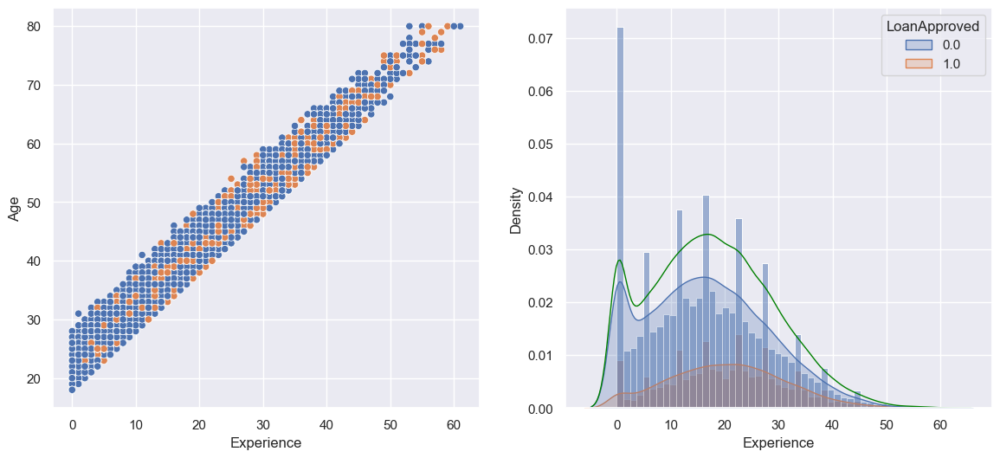

----------------------------------------------------





Statistics for MonthlyIncome: 



count    18809.000000

mean      4890.696409

std       3297.721015

min       1250.000000

25%       2631.500000

50%       4030.333333

75%       6157.083333

max      25000.000000

Name: MonthlyIncome, dtype: float64


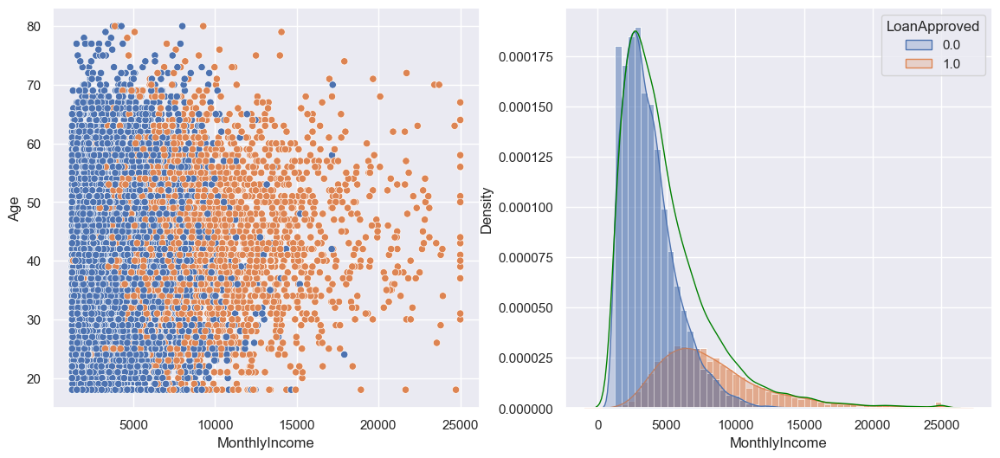

----------------------------------------------------





Statistics for Age: 



count    18816.000000

mean        39.764084

std         11.610042

min         18.000000

25%         32.000000

50%         40.000000

75%         48.000000

max         80.000000

Name: Age, dtype: float64


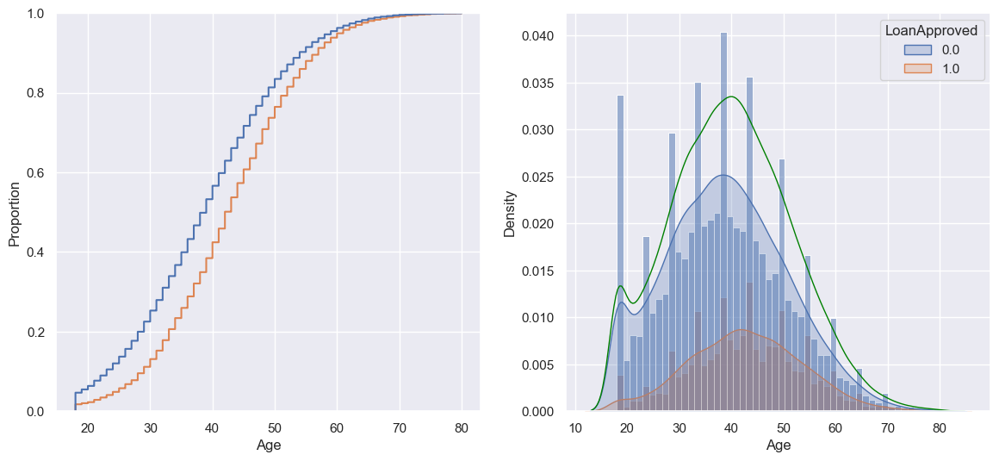

----------------------------------------------------





Statistics for RiskScore: 



count    19800.000000

mean        50.770394

std          7.771365

min         28.800000

25%         46.000000

50%         52.000000

75%         56.000000

max         84.000000

Name: RiskScore, dtype: float64


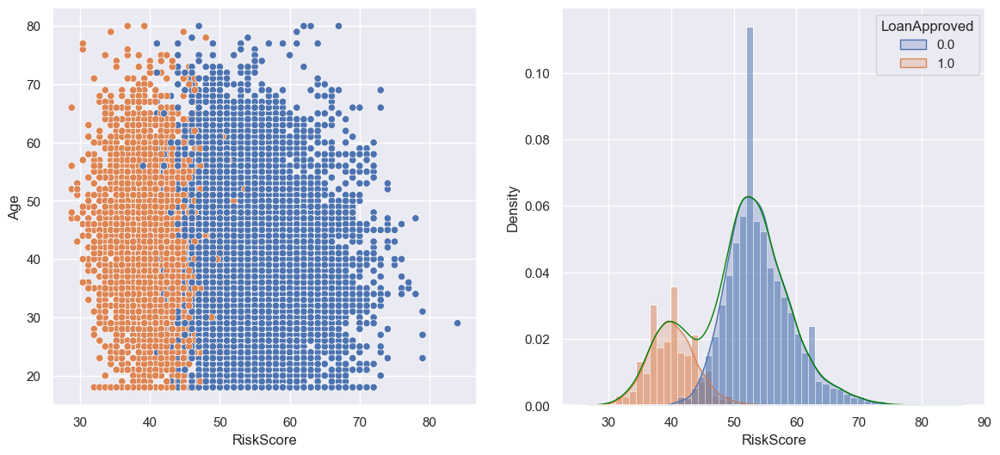

----------------------------------------------------





Statistics for TotalDebtToIncomeRatio: 



count    19800.000000

mean         0.401865

std          0.338396

min          0.016043

25%          0.179596

50%          0.302721

75%          0.508821

max          4.647657

Name: TotalDebtToIncomeRatio, dtype: float64


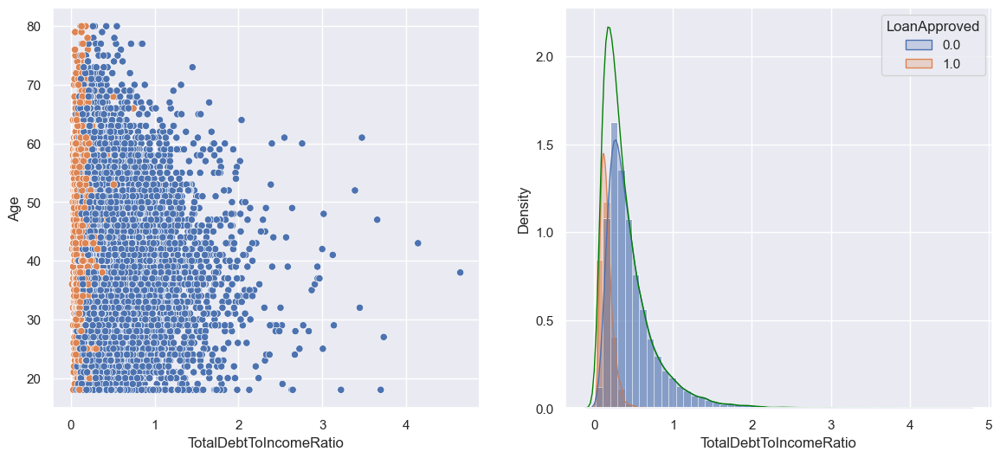

----------------------------------------------------





Statistics for UtilityBillsPaymentHistory: 



count    19800.000000

mean         0.800027

std          0.120591

min          0.259203

25%          0.727517

50%          0.821025

75%          0.892364

max          0.999433

Name: UtilityBillsPaymentHistory, dtype: float64


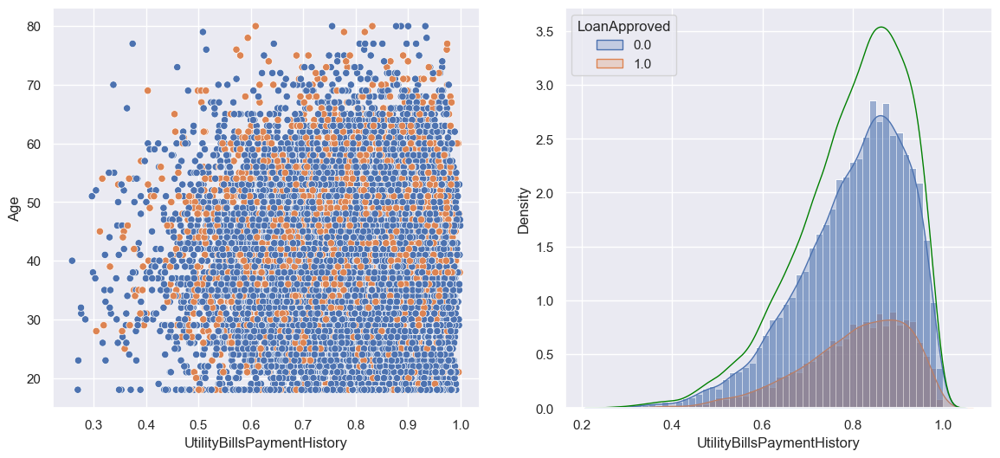

----------------------------------------------------





Statistics for PaymentHistory: 



count    18407.000000

mean        23.989243

std          4.948138

min          8.000000

25%         21.000000

50%         24.000000

75%         27.000000

max         45.000000

Name: PaymentHistory, dtype: float64


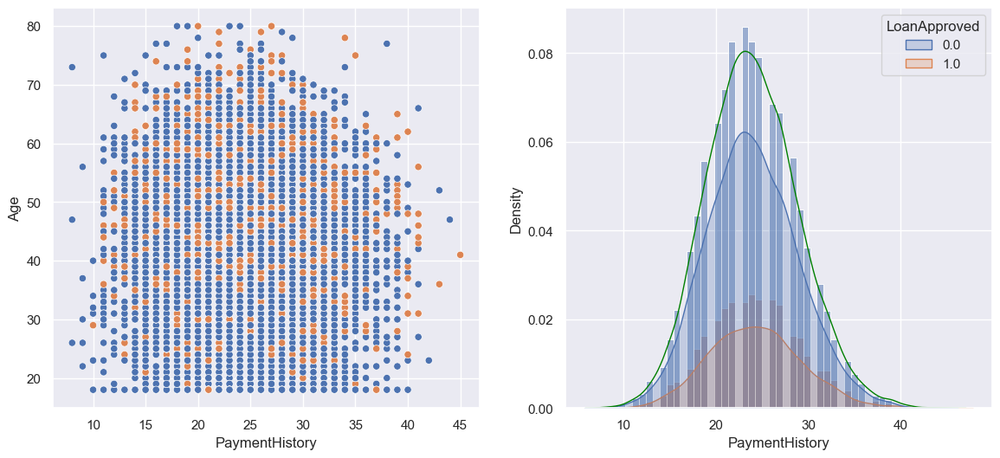

----------------------------------------------------





Statistics for InterestRate: 



count    19800.000000

mean         0.239126

std          0.042217

min          0.113310

25%          0.209172

50%          0.235404

75%          0.265534

max          0.446787

Name: InterestRate, dtype: float64


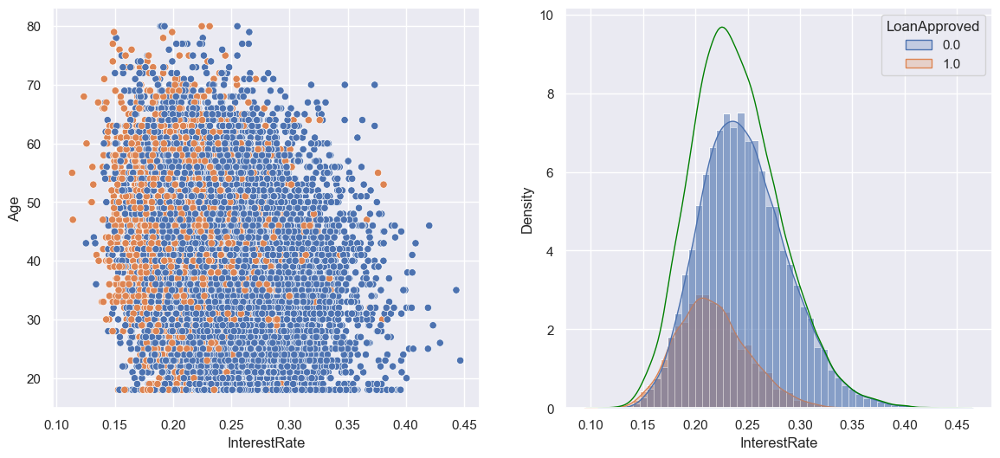

----------------------------------------------------





Statistics for DebtToIncomeRatio: 



count    19800.000000

mean         0.285755

std          0.160116

min          0.001720

25%          0.161120

50%          0.264638

75%          0.390286

max          0.902253

Name: DebtToIncomeRatio, dtype: float64


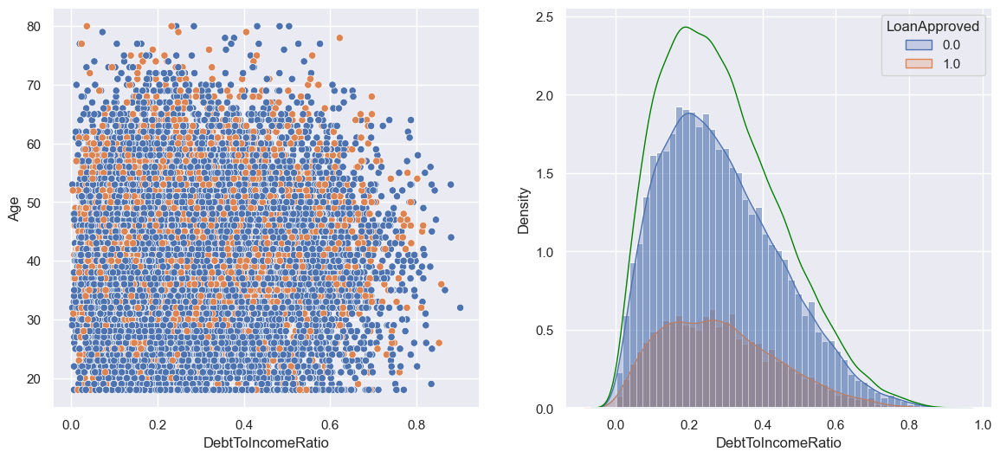

----------------------------------------------------





Statistics for BaseInterestRate: 



count    19800.000000

mean         0.239142

std          0.035507

min          0.130101

25%          0.213920

50%          0.236168

75%          0.261555

max          0.405029

Name: BaseInterestRate, dtype: float64


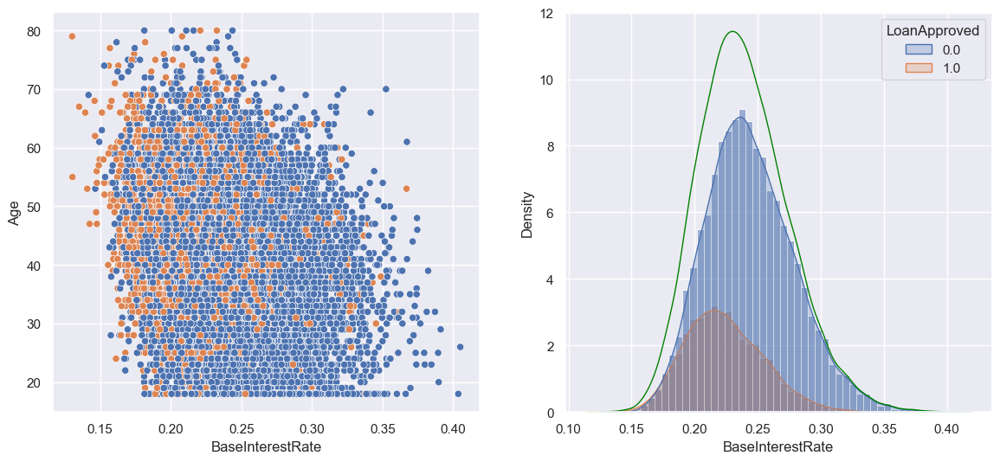

----------------------------------------------------





Statistics for MonthlyDebtPayments: 



count    19800.000000

mean       454.125758

std        240.624806

min         50.000000

25%        286.000000

50%        401.500000

75%        564.000000

max       2919.000000

Name: MonthlyDebtPayments, dtype: float64


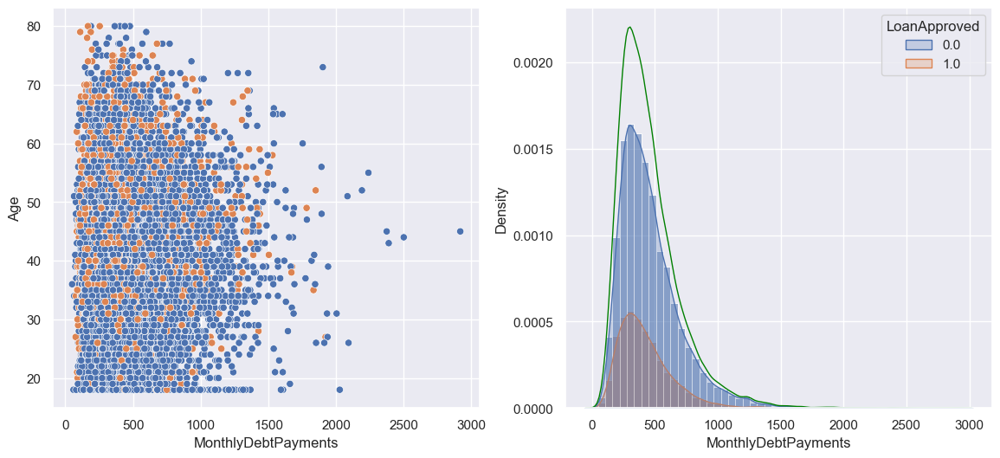

----------------------------------------------------





Statistics for MonthlyLoanPayment: 



count    19800.000000

mean       910.627942

std        672.702347

min         97.030193

25%        493.629931

50%        728.249666

75%       1111.682010

max      10892.629520

Name: MonthlyLoanPayment, dtype: float64


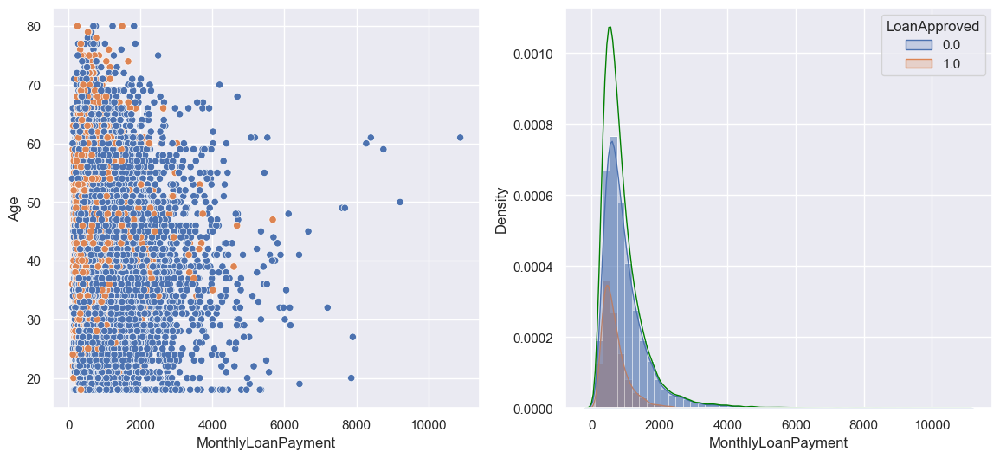

----------------------------------------------------





Statistics for CreditCardUtilizationRate: 



count    19800.000000

mean         0.286337

std          0.159866

min          0.000974

25%          0.160735

50%          0.266282

75%          0.390576

max          0.917380

Name: CreditCardUtilizationRate, dtype: float64


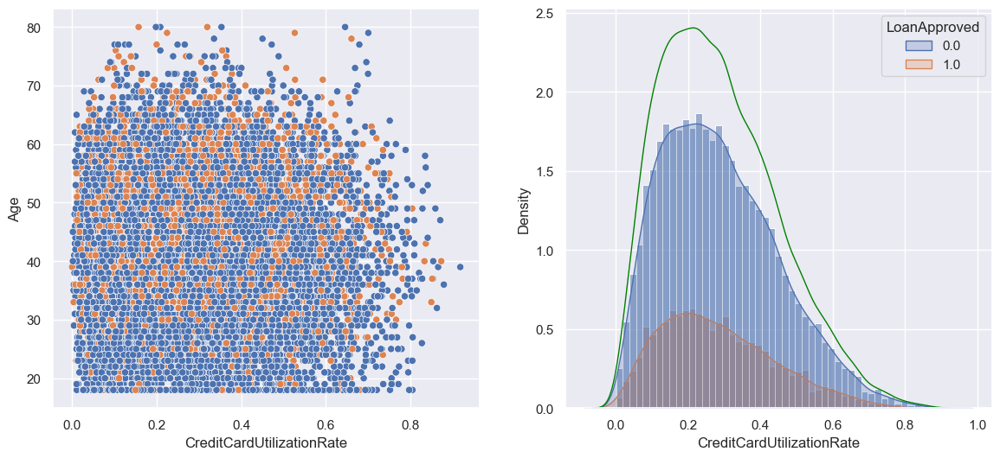

----------------------------------------------------





Statistics for CreditScore: 



count    18808.000000

mean       571.487824

std         50.957533

min        343.000000

25%        540.000000

50%        578.000000

75%        609.000000

max        712.000000

Name: CreditScore, dtype: float64


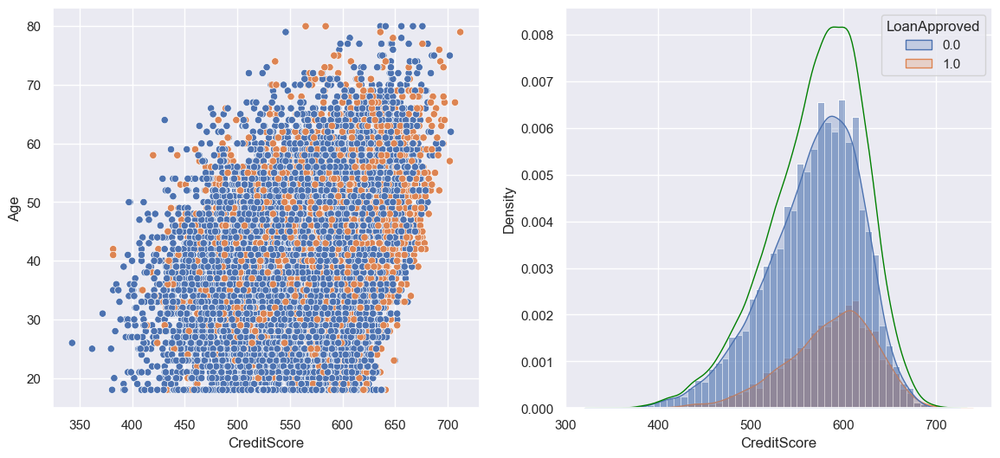

----------------------------------------------------





Statistics for EmploymentStatus: 



count        17816

unique           3

top       Employed

freq         15180

Name: EmploymentStatus, dtype: object


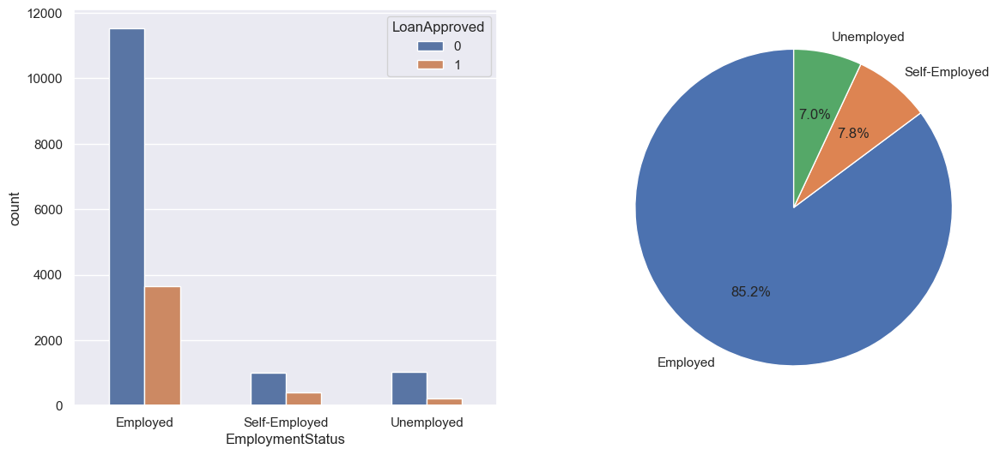

----------------------------------------------------





Statistics for EducationLevel: 



count        18812

unique           5

top       Bachelor

freq          5692

Name: EducationLevel, dtype: object


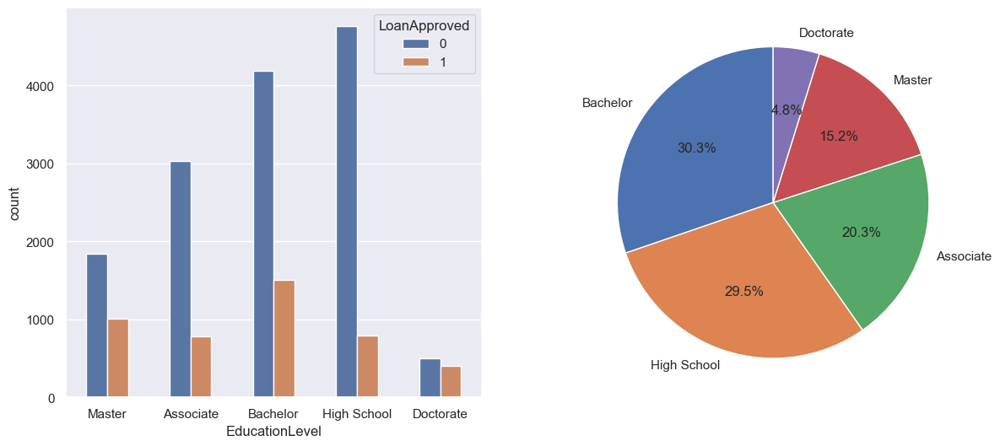

----------------------------------------------------





Statistics for MaritalStatus: 



count       17820

unique          4

top       Married

freq         8940

Name: MaritalStatus, dtype: object


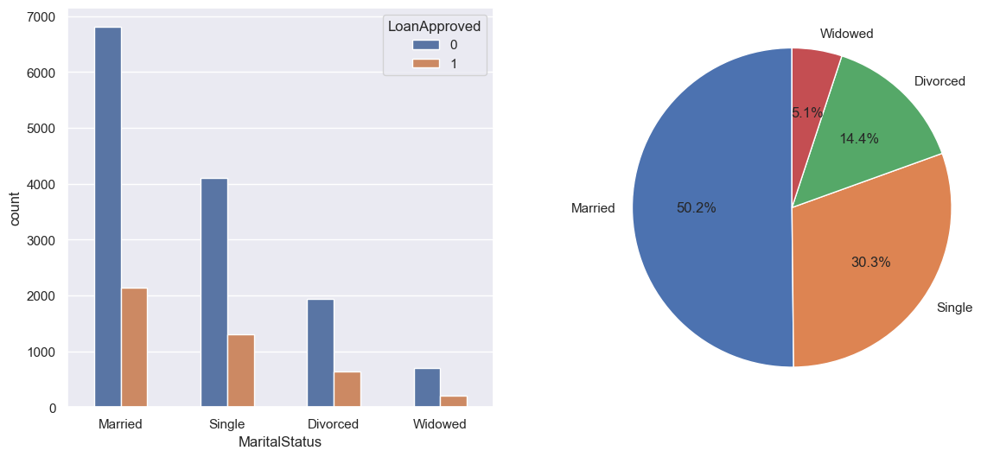

----------------------------------------------------





Statistics for HomeOwnershipStatus: 



count        19800

unique           4

top       Mortgage

freq          7853

Name: HomeOwnershipStatus, dtype: object


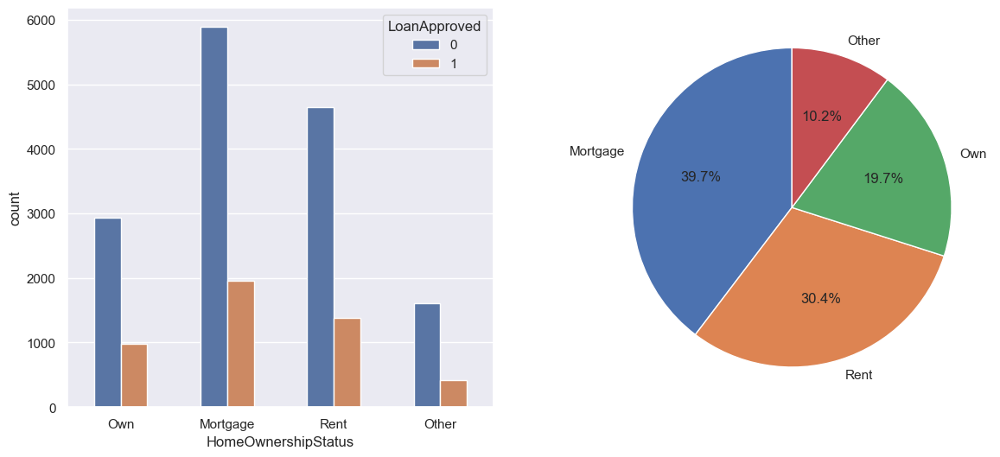

----------------------------------------------------





Statistics for LoanPurpose: 



count     19800

unique        5

top        Home

freq       5864

Name: LoanPurpose, dtype: object


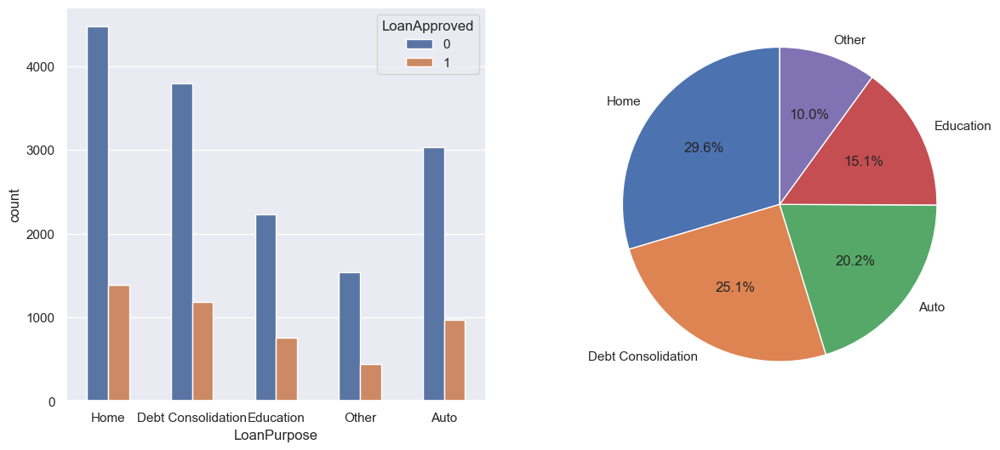

----------------------------------------------------





Statistics for TotalAssets: 



count    1.940300e+04

mean     9.673597e+04

std      1.197036e+05

min      2.098000e+03

25%      3.113100e+04

50%      6.058200e+04

75%      1.172650e+05

max      2.619627e+06

Name: TotalAssets, dtype: float64


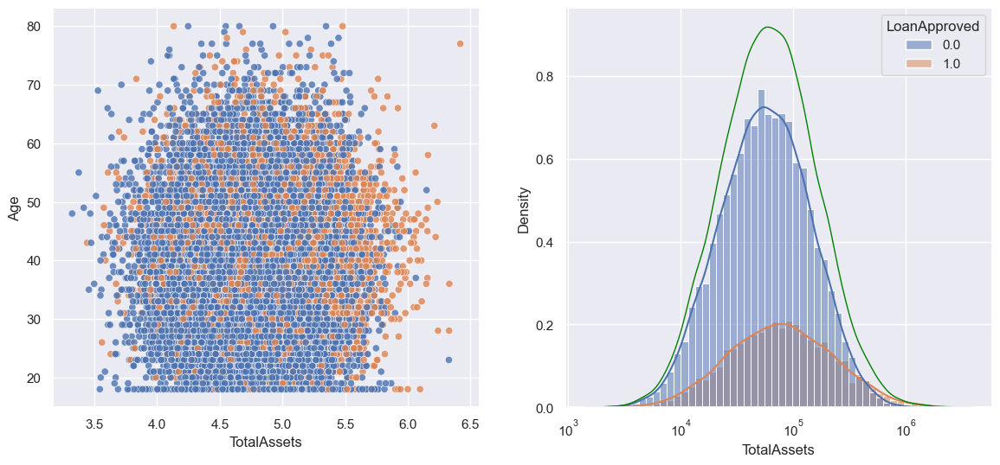

----------------------------------------------------





Statistics for NetWorth: 



count    1.980000e+04

mean     7.214437e+04

std      1.166882e+05

min      1.000000e+03

25%      8.722750e+03

50%      3.285550e+04

75%      8.866725e+04

max      2.598936e+06

Name: NetWorth, dtype: float64


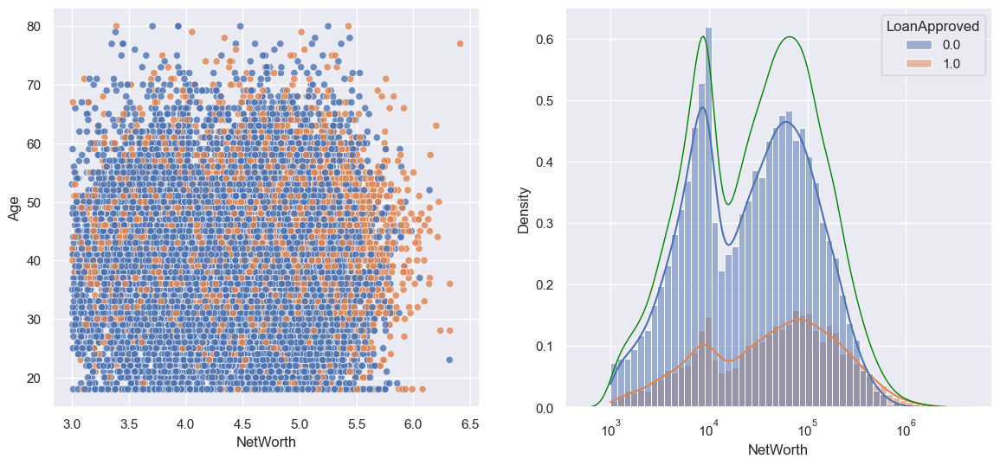

----------------------------------------------------





Statistics for TotalLiabilities: 



count    1.940300e+04

mean     3.635665e+04

std      4.744608e+04

min      3.720000e+02

25%      1.122200e+04

50%      2.224300e+04

75%      4.315800e+04

max      1.417302e+06

Name: TotalLiabilities, dtype: float64


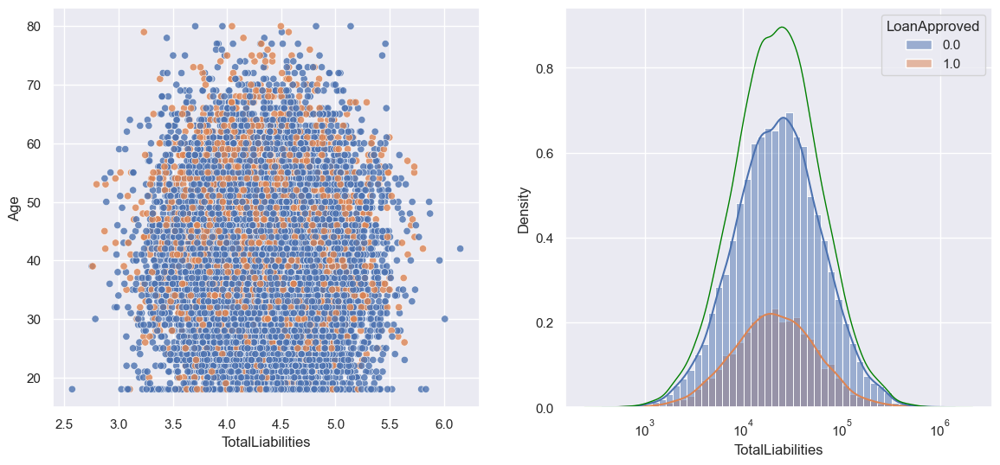

----------------------------------------------------





Statistics for AnnualIncome: 



count     18216.000000

mean      59214.070213

std       40440.035805

min       15000.000000

25%       31649.750000

50%       48560.500000

75%       74391.000000

max      485341.000000

Name: AnnualIncome, dtype: float64


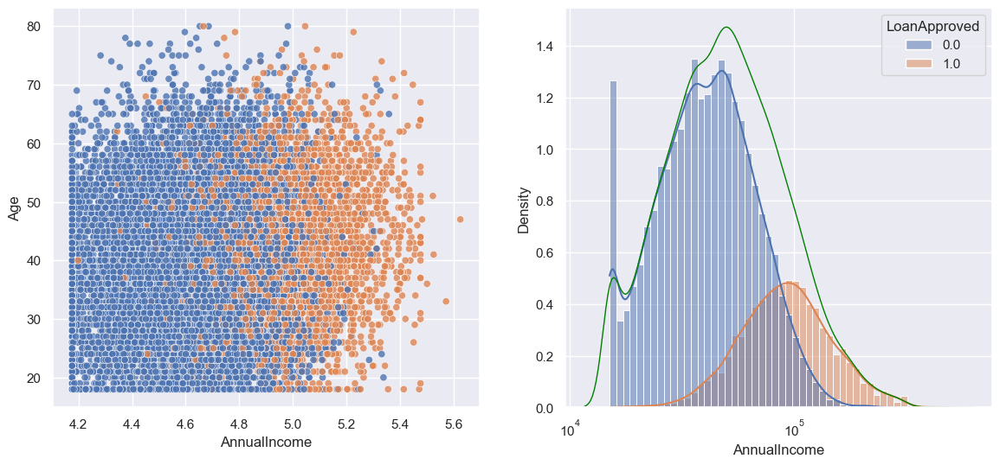

----------------------------------------------------





Statistics for CheckingAccountBalance: 



count    19800.000000

mean      1779.637172

std       2239.986469

min         24.000000

25%        551.000000

50%       1115.000000

75%       2124.000000

max      52572.000000

Name: CheckingAccountBalance, dtype: float64


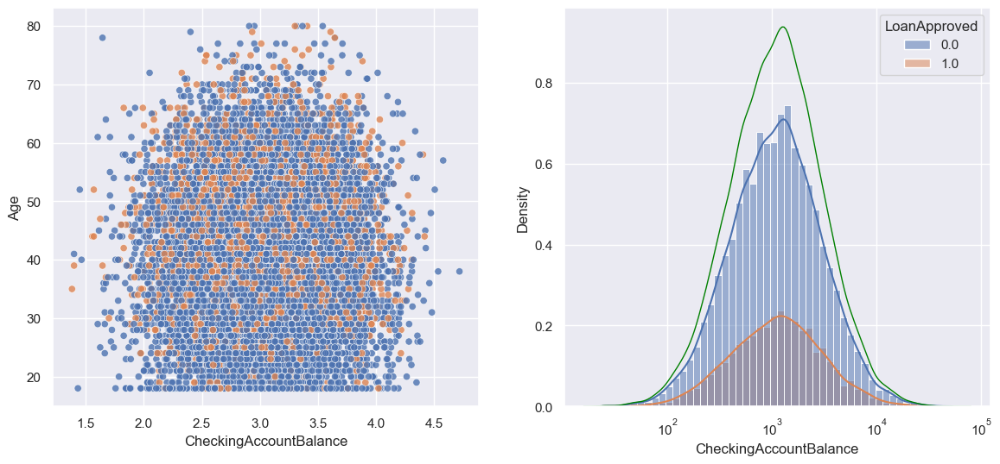

----------------------------------------------------





Statistics for SavingsAccountBalance: 



count     17814.000000

mean       4933.669698

std        6606.601287

min          73.000000

25%        1543.000000

50%        2980.000000

75%        5857.000000

max      200089.000000

Name: SavingsAccountBalance, dtype: float64


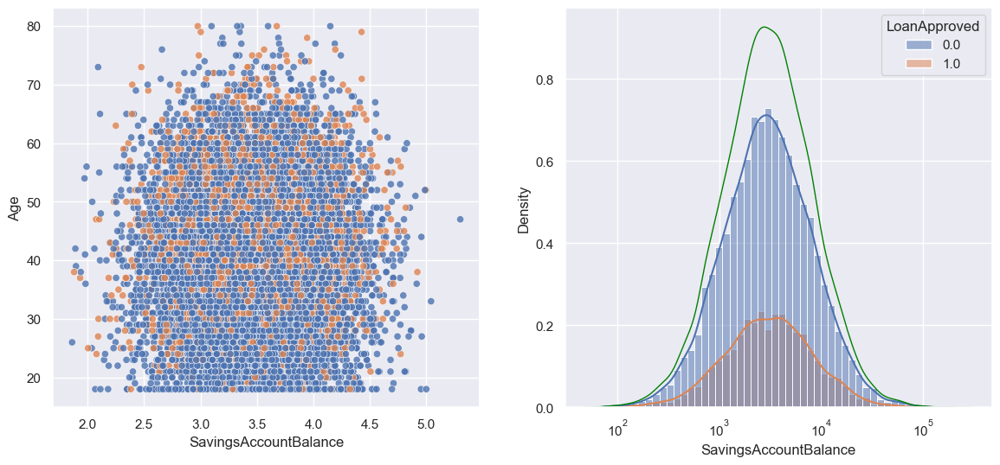

----------------------------------------------------





Statistics for LoanAmount: 



count     18807.000000

mean      24875.843144

std       13464.361491

min        3674.000000

25%       15528.000000

50%       21897.000000

75%       30835.000000

max      184732.000000

Name: LoanAmount, dtype: float64


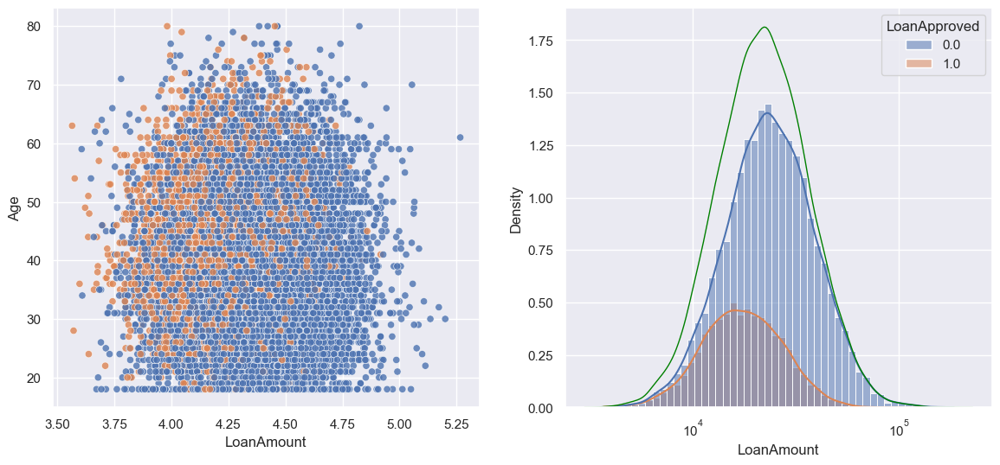

----------------------------------------------------





Statistics for LoanDuration: 



count    19800.00000

mean        54.07697

std         24.66907

min         12.00000

25%         36.00000

50%         48.00000

75%         72.00000

max        120.00000

Name: LoanDuration, dtype: float64


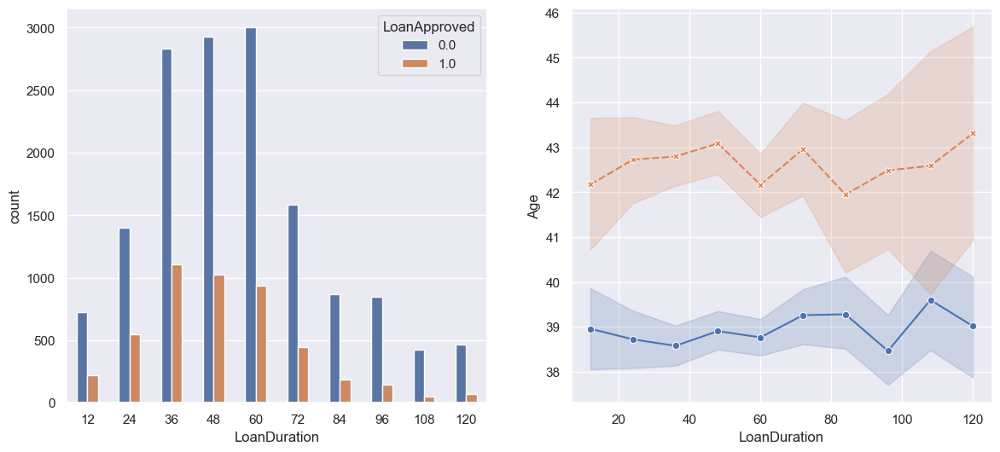

----------------------------------------------------





Statistics for BankruptcyHistory: 



count    19800.000000

mean         0.052323

std          0.222684

min          0.000000

25%          0.000000

50%          0.000000

75%          0.000000

max          1.000000

Name: BankruptcyHistory, dtype: float64


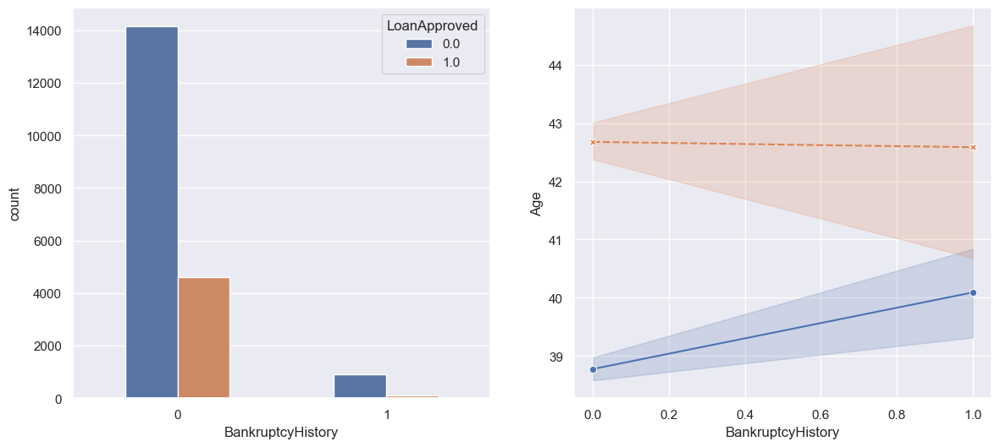

----------------------------------------------------





Statistics for PreviousLoanDefaults: 



count    19800.000000

mean         0.099899

std          0.299873

min          0.000000

25%          0.000000

50%          0.000000

75%          0.000000

max          1.000000

Name: PreviousLoanDefaults, dtype: float64


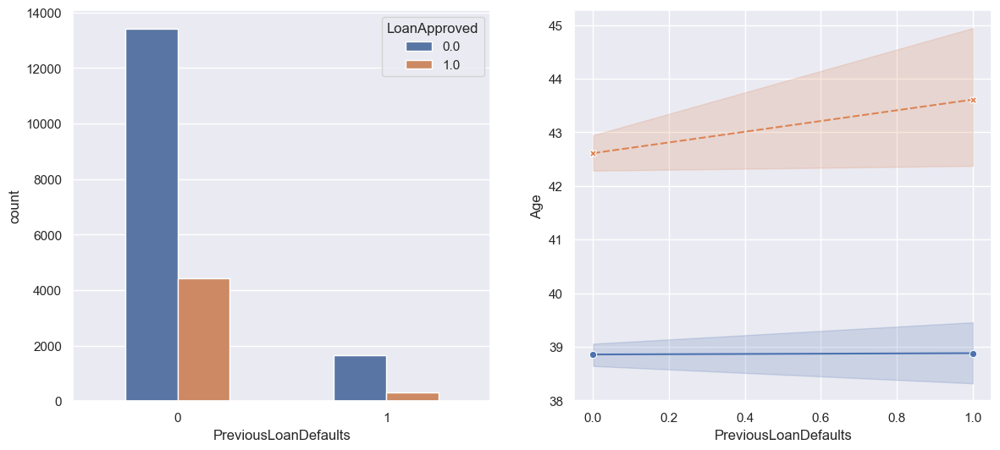

----------------------------------------------------





Statistics for NumberOfCreditInquiries: 



count    19800.000000

mean         0.993283

std          0.987218

min          0.000000

25%          0.000000

50%          1.000000

75%          2.000000

max          7.000000

Name: NumberOfCreditInquiries, dtype: float64


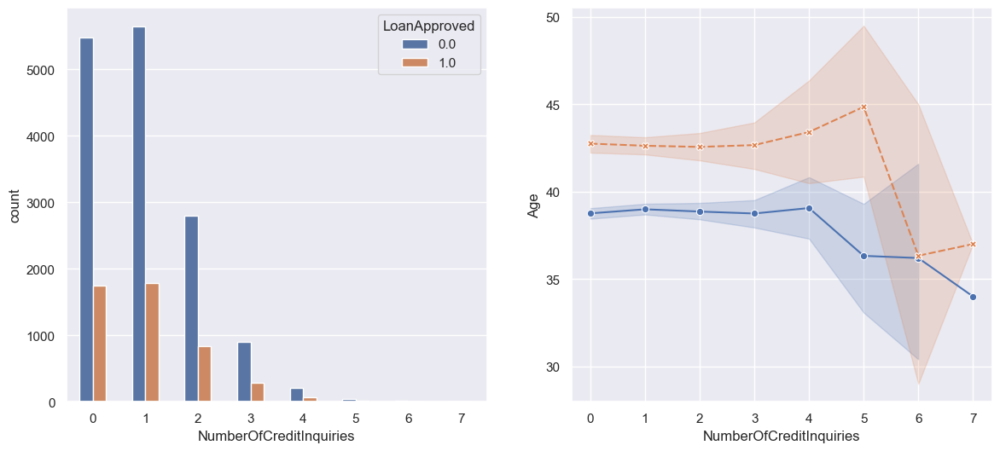

----------------------------------------------------





Statistics for NumberOfOpenCreditLines: 



count    19800.000000

mean         3.021364

std          1.734513

min          0.000000

25%          2.000000

50%          3.000000

75%          4.000000

max         13.000000

Name: NumberOfOpenCreditLines, dtype: float64


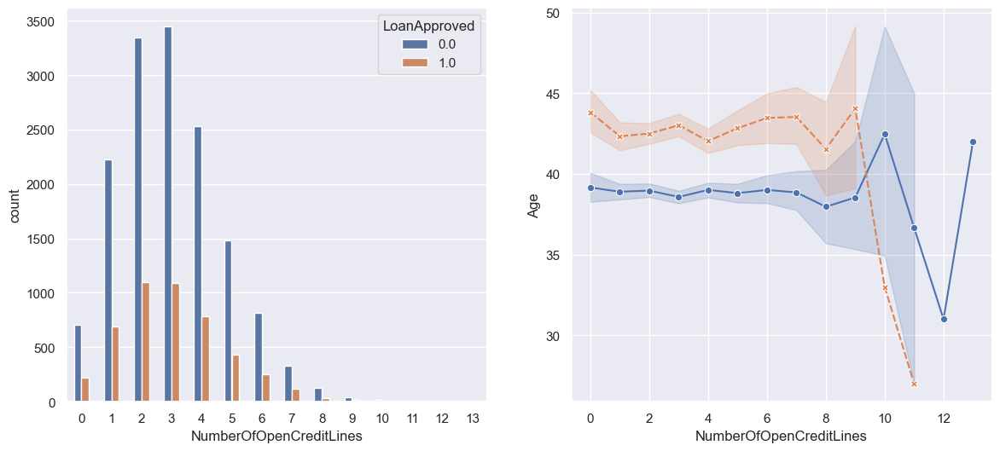

----------------------------------------------------





Statistics for NumberOfDependents: 



count    19800.000000

mean         1.518384

std          1.386756

min          0.000000

25%          0.000000

50%          1.000000

75%          2.000000

max          5.000000

Name: NumberOfDependents, dtype: float64


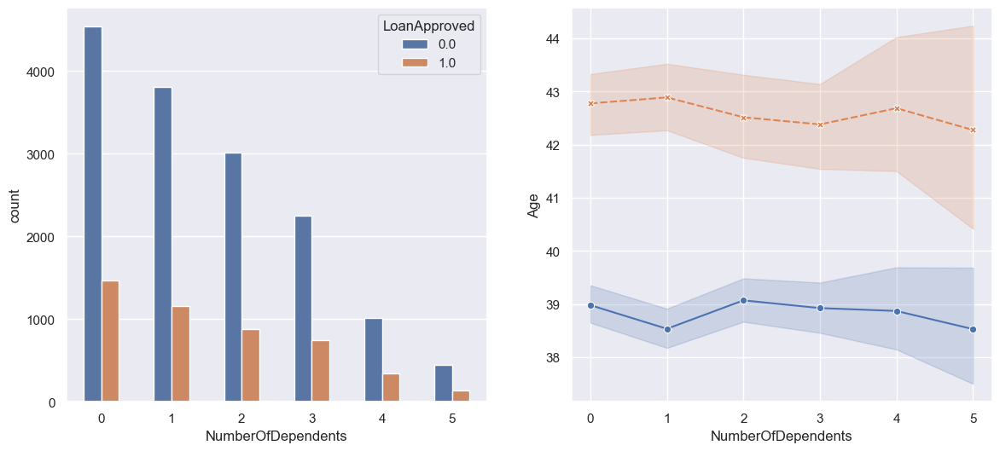

----------------------------------------------------





Statistics for JobTenure: 



count    19800.000000

mean         5.003030

std          2.237093

min          0.000000

25%          3.000000

50%          5.000000

75%          6.000000

max         16.000000

Name: JobTenure, dtype: float64


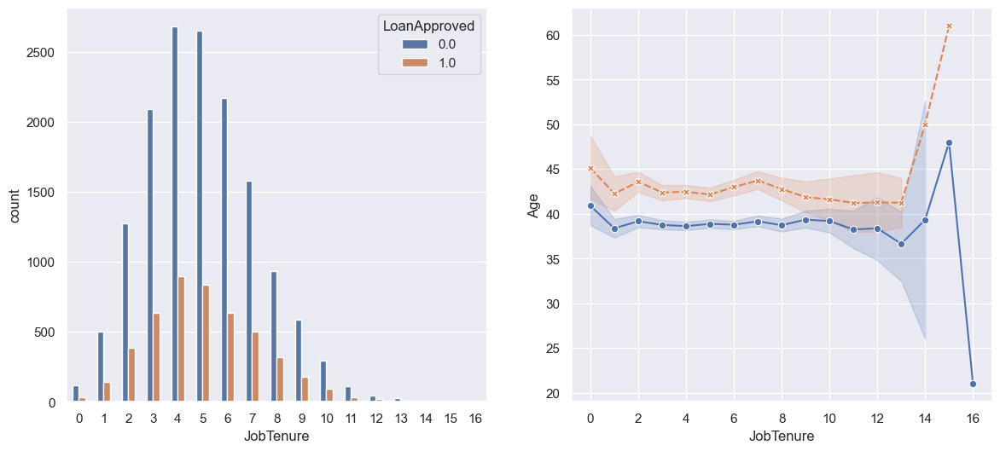

----------------------------------------------------





Statistics for LengthOfCreditHistory: 



count    19800.000000

mean        14.958283

std          8.374745

min          1.000000

25%          8.000000

50%         15.000000

75%         22.000000

max         29.000000

Name: LengthOfCreditHistory, dtype: float64


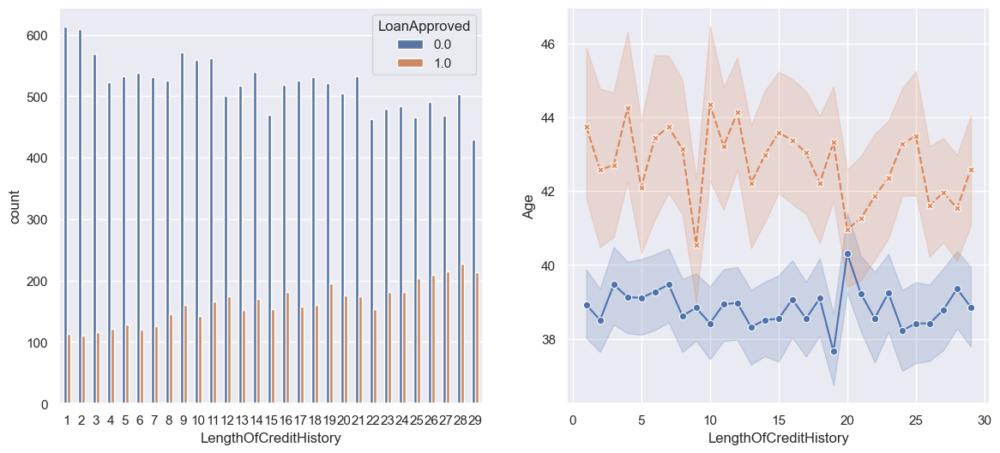

----------------------------------------------------





Statistics for LoanApproved: 



count    19800.000000

mean         0.238687

std          0.426292

min          0.000000

25%          0.000000

50%          0.000000

75%          0.000000

max          1.000000

Name: LoanApproved, dtype: float64


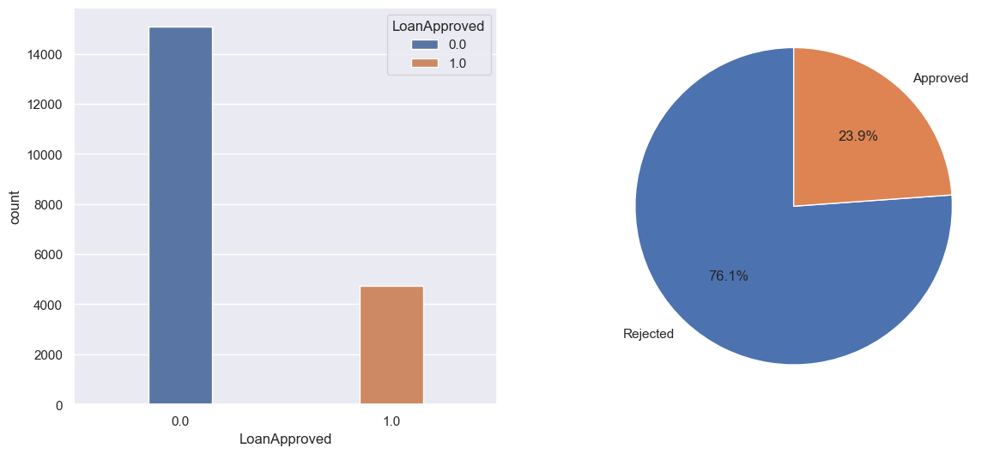

----------------------------------------------------






In [174]:
# Plot computation:

data_statistics(df_corrupted, numerical_features, categorical_features, discrete_features, high_values_features, label_feature)

**STAGE 0.3**: MISSING VALUES ANALYSIS

In [175]:
df_corrupted.info()

<class 'pandas.core.frame.DataFrame'>

RangeIndex: 20000 entries, 0 to 19999

Data columns (total 36 columns):

 #   Column                      Non-Null Count  Dtype  

---  ------                      --------------  -----  

 0   ApplicationDate             7929 non-null   object 

 1   Age                         18816 non-null  float64

 2   AnnualIncome                18216 non-null  float64

 3   CreditScore                 18808 non-null  float64

 4   EmploymentStatus            17816 non-null  object 

 5   EducationLevel              18812 non-null  object 

 6   Experience                  19800 non-null  float64

 7   LoanAmount                  18807 non-null  float64

 8   LoanDuration                19800 non-null  float64

 9   MaritalStatus               17820 non-null  object 

 10  NumberOfDependents          19800 non-null  float64

 11  HomeOwnershipStatus         19800 non-null  object 

 12  MonthlyDebtPayments         19800 non-null  float64

 13  CreditCardUti

In [176]:
# Missing values statistics:

null_count = df_corrupted.isnull().sum().sum().item()  # First sum counts the missing values for each column, the second the total across all columns, and .item() returns the integer from np.int64
null_rows =(df_corrupted.isnull().sum(axis=1) == 36).sum().item()  # Sum of missing values across rows (axis=1), Having 36 columns in total, we want to understand how many completely null rows we have.

print(f'Number of missing values: {null_count} \n')
print(f'Percentange of missing values: {null_count / (len(df_corrupted) * len(df_corrupted.columns)):.3f}% \n')
print(f'Number of completely corrupted rows: {null_rows}')

Number of missing values: 33740 



Percentange of missing values: 0.047% 



Number of completely corrupted rows: 200


In [177]:
# Missing values statistics per feature:

columns = df_corrupted.columns  

col_width = max(len(col) for col in columns) + 2  # Computation of space between columns using the column with largest name + 2 spaces.

for i in columns:
    missing_count = df_corrupted[i].isnull().sum()  # Count of null values per column.
    missing_percentage = missing_count / df_corrupted.shape[0] * 100   # Percentage of null values.
    print(f'{i:<{col_width}} - Missing values: {missing_count:<10} - Percentage: {missing_percentage:>6.2f}%')

ApplicationDate              - Missing values: 12071      - Percentage:  60.36%

Age                          - Missing values: 1184       - Percentage:   5.92%

AnnualIncome                 - Missing values: 1784       - Percentage:   8.92%

CreditScore                  - Missing values: 1192       - Percentage:   5.96%

EmploymentStatus             - Missing values: 2184       - Percentage:  10.92%

EducationLevel               - Missing values: 1188       - Percentage:   5.94%

Experience                   - Missing values: 200        - Percentage:   1.00%

LoanAmount                   - Missing values: 1193       - Percentage:   5.96%

LoanDuration                 - Missing values: 200        - Percentage:   1.00%

MaritalStatus                - Missing values: 2180       - Percentage:  10.90%

NumberOfDependents           - Missing values: 200        - Percentage:   1.00%

HomeOwnershipStatus          - Missing values: 200        - Percentage:   1.00%

MonthlyDebtPayments         

<Axes: >

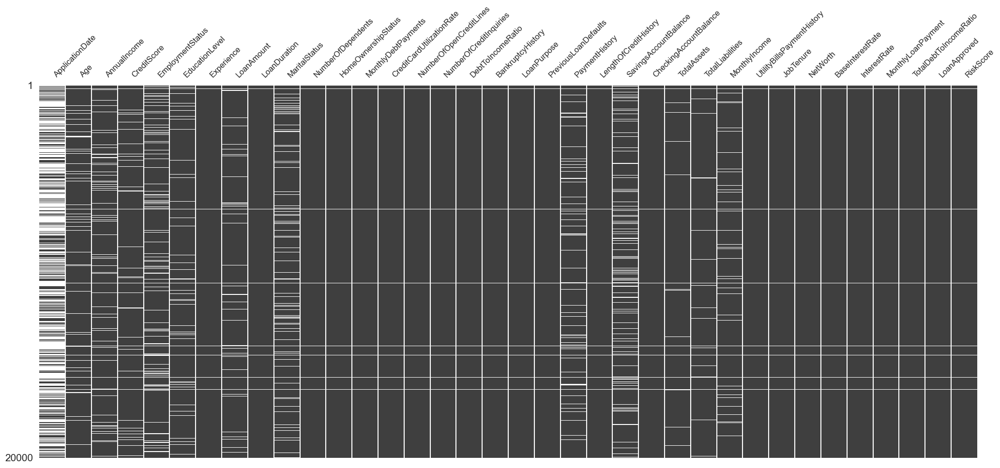

In [178]:
# Values sparity visualization:

msno.matrix(df_corrupted, sparkline=False, fontsize=12)

<Axes: >

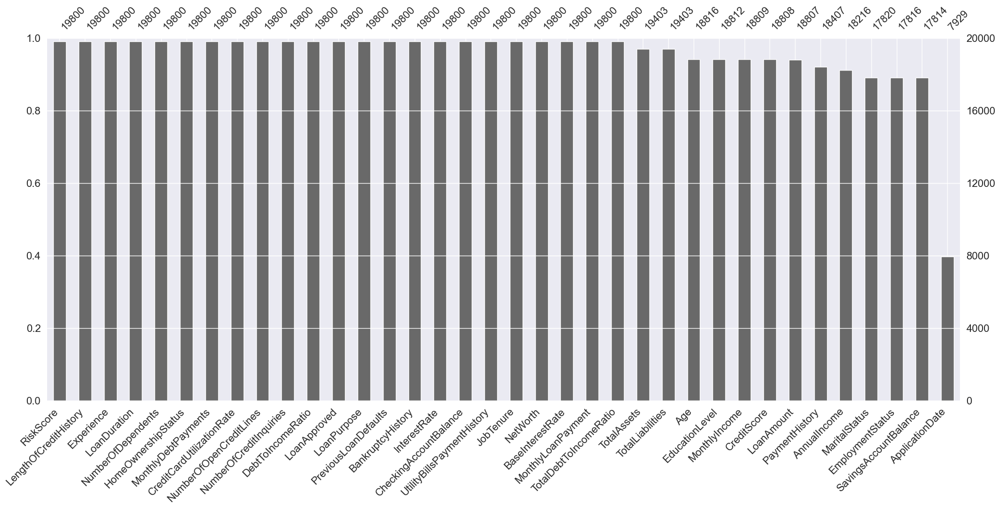

In [179]:
# Bar visualization for missing data

msno.bar(df_corrupted, labels=True, sort="descending")

<Axes: >

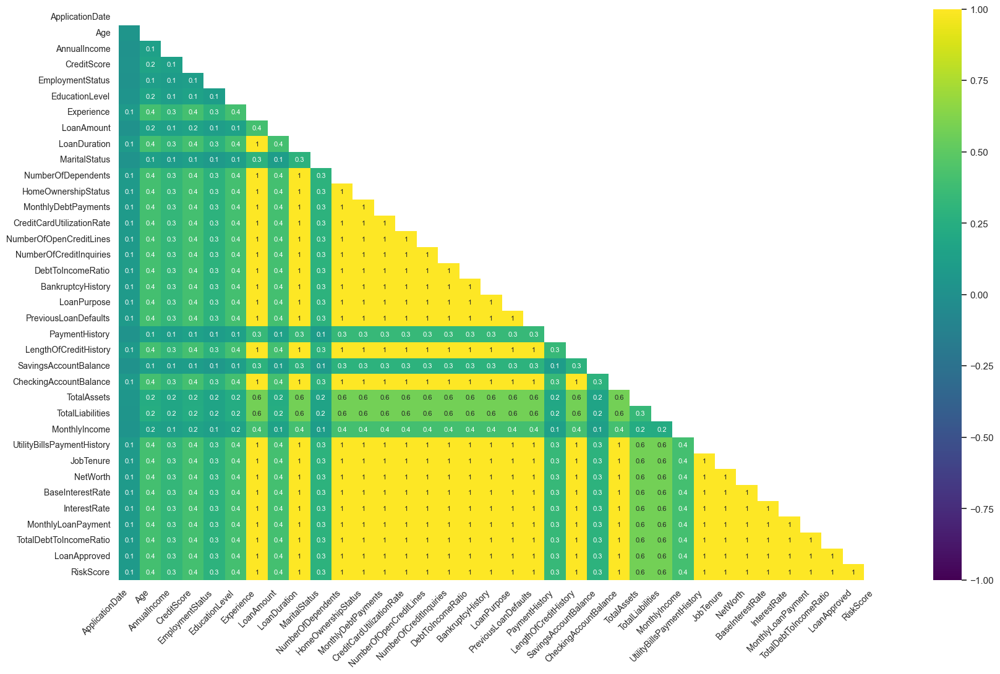

In [180]:
# Heatmap visualization for correlation of missing data among feaures:

msno.heatmap(df_corrupted, labels=True, cmap="viridis", fontsize=10)

In [181]:
# Removal of completely corrupted rows and columns:

df_corr = df_corrupted.dropna(axis=0, how='all')  # Removal of rows which have only null values.
df_corr = df_corr.drop(columns=['ApplicationDate'])  # Removal of 'ApplicationDate' column.

In [182]:
df_corr

,Age,AnnualIncome,CreditScore,EmploymentStatus,EducationLevel,Experience,LoanAmount,LoanDuration,MaritalStatus,NumberOfDependents,...,MonthlyIncome,UtilityBillsPaymentHistory,JobTenure,NetWorth,BaseInterestRate,InterestRate,MonthlyLoanPayment,TotalDebtToIncomeRatio,LoanApproved,RiskScore
0,45.0,39948.0,617.0,Employed,Master,22.0,13152.0,48.0,Married,2.0,...,3329.000000,0.724972,11.0,126928.0,0.199652,0.227590,419.805992,0.181077,0.0,49.0
1,38.0,39709.0,628.0,Employed,Associate,15.0,NaN,48.0,Single,1.0,...,3309.083333,0.935132,3.0,43609.0,0.207045,0.201077,794.054238,0.389852,0.0,52.0
2,47.0,NaN,570.0,Employed,Bachelor,26.0,17627.0,36.0,Married,2.0,...,3393.666667,0.872241,6.0,5205.0,0.217627,0.212548,666.406688,0.462157,0.0,52.0
3,58.0,69084.0,545.0,Employed,High School,34.0,37898.0,96.0,Single,1.0,...,5757.000000,0.896155,5.0,99452.0,0.300398,0.300911,1047.506980,0.313098,0.0,54.0
5,37.0,178310.0,626.0,Self-Employed,Master,16.0,15433.0,72.0,Married,0.0,...,14859.166667,0.756079,5.0,27071.0,0.217433,0.217601,385.577074,0.075211,1.0,44.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19995,44.0,30180.0,587.0,Employed,High School,19.0,24521.0,36.0,Married,3.0,...,2515.000000,0.826217,1.0,55327.0,0.216021,0.195574,905.767712,0.627741,0.0,55.0
19996,56.0,49246.0,567.0,Employed,Associate,33.0,25818.0,36.0,Married,5.0,...,4103.833333,0.816618,3.0,64002.0,0.227318,0.199168,958.395633,0.334418,0.0,54.0
19997,44.0,48958.0,645.0,NaN,Bachelor,20.0,37033.0,72.0,Married,3.0,...,4079.833333,0.887216,3.0,103663.0,0.229533,0.226766,945.427454,0.357227,0.0,45.0
19998,60.0,41025.0,560.0,Employed,High School,36.0,14760.0,72.0,Married,3.0,...,3418.750000,0.843787,5.0,10600.0,0.249760,0.264873,411.168284,0.408678,0.0,59.0


<Axes: >

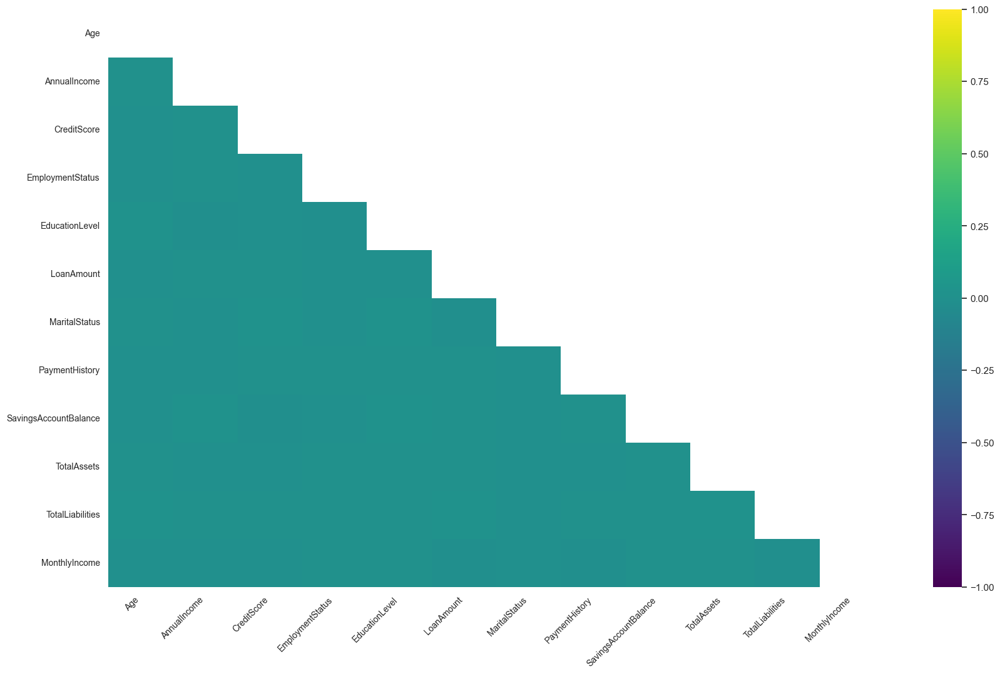

In [183]:
# Heatmap visualization for correlation of missing data among feaures (after removal of completely corrupted rows):

msno.heatmap(df_corr, labels=True, cmap="viridis", fontsize=10)

**STAGE 0.4**: FEATURE CORRELATION ANALYSIS

In [184]:
# Unique values for categorical features:

print(df_corr['MaritalStatus'].unique())
print(df_corr['EducationLevel'].unique())
print(df_corr['EmploymentStatus'].unique())
print(df_corr['HomeOwnershipStatus'].unique())
print(df_corr['LoanPurpose'].unique())

['Married' 'Single' 'Divorced' 'Widowed' nan]

['Master' 'Associate' 'Bachelor' 'High School' 'Doctorate' nan]

['Employed' 'Self-Employed' nan 'Unemployed']

['Own' 'Mortgage' 'Rent' 'Other']

['Home' 'Debt Consolidation' 'Education' 'Other' 'Auto']


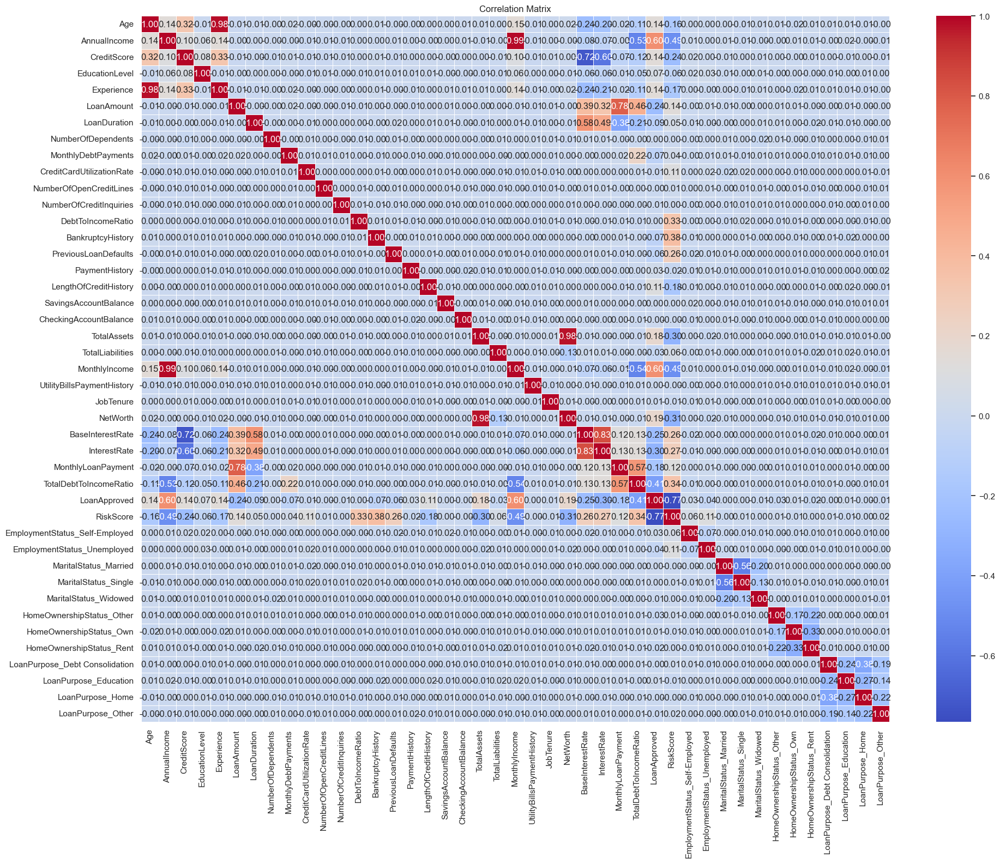

In [185]:
# Visualization of correlation between features:

df_correlation_copy = df_corr.copy()  # Copy of current dataset to not affect it.

df_correlation_copy['EducationLevel'] = df_correlation_copy['EducationLevel'].map({'High School': 0, 'Bachelor': 1, 'Master': 2, 'Doctorate': 3, 'Associate': 4})  # Ordinal encoding of ordinal features.

nominal_columns = ['EmploymentStatus', 'MaritalStatus', 'HomeOwnershipStatus', 'LoanPurpose']  # Nominal columns to encode.

df_encoded = pd.get_dummies(df_correlation_copy, columns=nominal_columns, drop_first=True)  # One-hot encoding of nominal features.

corr_matrix = df_encoded.corr()  # Correlation matrix creation

plt.figure(figsize=(20, 16))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', linewidths=0.5, fmt='.2f')
plt.title('Correlation Matrix')
plt.tight_layout()
plt.show()

In [186]:
# Function to get pairs of feature with correlation above threshold:

def correlations(matrix, thresh):  

    features = matrix.columns
    problematic_pairs = []

    for i in range(len(features)):
        for j in range(i + 1, len(features)):  # We are iterating on the lower diagonal of the matrix.
            if abs(corr_matrix.iloc[i, j]) >= thresh:  # We want to get the the cells with values above our threshold.
                problematic_pairs.append((features[i], features[j], float(corr_matrix.iloc[i, j].round(2))))  # If a cell has such a value, we add a tuple in problematic_pairs containing the features name and the value.
                
    return problematic_pairs


# Function to display such pairs:

def corr_plots(pairs):

    for k in pairs:
        print(f'Correlation between {k[0]} and {k[1]}: {corr_matrix[k[0]][k[1]]:.2f}')
        sns.set_theme()
        g = sns.JointGrid(x=df_encoded[k[0]], y=df_encoded[k[1]], hue=df_encoded['LoanApproved'])  # For each pair we plot the joint grid to understand how it developed the correlation.
        g.plot_joint(sns.scatterplot, s=50, alpha=.5)
        g.plot_marginals(sns.histplot, kde=True)  # Plotting of marginal distributions via histograms.

        plt.show()
        print('----------------------------------------------------')
        print(f'\n')


# Function to get the most redundant features among the pairs:

def get_redundant(pairs, risk, loan):

    redundant_features = []

    for feature1, feature2, corr in pairs:  # We iterate across the problematic_pairs list.
        risk_score1 = abs(risk[feature1])   # Absolute value of correlation between feature 1 and Risk score
        risk_score2 = abs(risk[feature2])   # Absolute value of correlation between feature 2 and Risk score
        loan_approved1 = abs(loan[feature1])  # Absolute value of correlation between feature 1 and Loan Approval
        loan_approved2 = abs(loan[feature2])  # Absolute value of correlation between feature 2 and Loan Approval
        
        score1 = 0.4 * risk_score1 + 0.6 * loan_approved1  # Weighted score with more emphasis on loan approval for feature 1
        score2 = 0.4 * risk_score2 + 0.6 * loan_approved2  # Weighted score with more emphasis on loan approval for feature 2

        if score1 < score2:   # If feature 1 has lower score of correlation with labels we remove it.
            redundant_features.append(feature1)
        elif score1 > score2:  # If feature 2 has lower score of correlation with labels we remove it.
            redundant_features.append(feature2)
        elif corr_matrix[feature1].abs().sum() < corr_matrix[feature2].abs().sum():  # If they have equal correlation score wrt the labels, we remove the one which has the lower absolute correlation sum across all features (The one less informative).
            redundant_features.append(feature1)
        else:
            redundant_features.append(feature2)

    return redundant_features

In [187]:
correlations(corr_matrix, 0.8)

[('Age', 'Experience', 0.98),
 ('AnnualIncome', 'MonthlyIncome', 0.99),
 ('TotalAssets', 'NetWorth', 0.98),
 ('BaseInterestRate', 'InterestRate', 0.83)]

Correlation between Age and Experience: 0.98


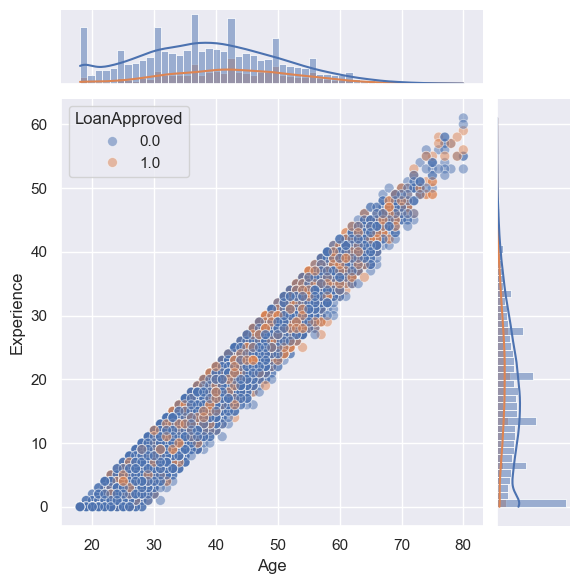

----------------------------------------------------





Correlation between AnnualIncome and MonthlyIncome: 0.99


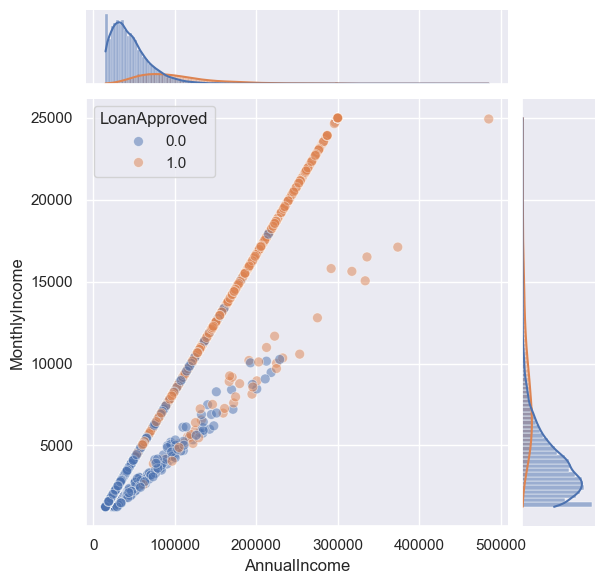

----------------------------------------------------





Correlation between TotalAssets and NetWorth: 0.98


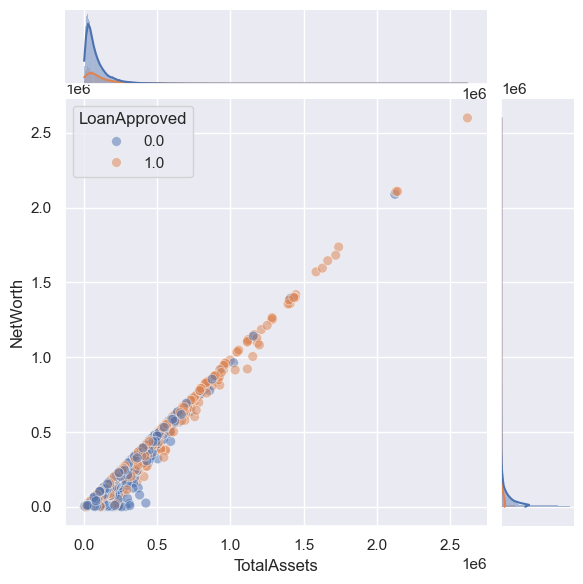

----------------------------------------------------





Correlation between BaseInterestRate and InterestRate: 0.83


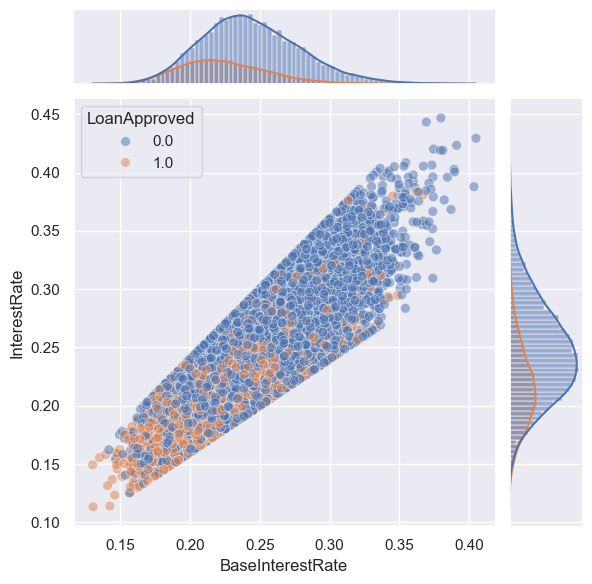

----------------------------------------------------






In [188]:
corr_plots(correlations(corr_matrix, 0.8))

In [189]:
target1_corr = corr_matrix['RiskScore'].abs()  # Series of absolute correlation values of feature 'RiskScore' wrt any other feature
target2_corr =corr_matrix['LoanApproved'].abs()   # Series of absolute correlation values of feature 'LoanApproval' wrt any other feature

redundant_features = get_redundant(correlations(corr_matrix, 0.8), target1_corr, target2_corr)

print(f'Redundant features: {redundant_features}')

Redundant features: ['Age', 'AnnualIncome', 'TotalAssets', 'BaseInterestRate']


In [190]:
corr_matrix['LoanApproved'].abs().sort_values(ascending=False).head(2)  # As we can see, the risk score is the most correlated feature wrt to the loan approval.

LoanApproved    1.000000
RiskScore       0.765893
Name: LoanApproved, dtype: float64

In [191]:
# Function to get the worst n correlated features wrt to the labels:

def get_worst_correlations(corr_matrix, amount):  # We want to get rid of some features which are not so much informative for the labels:

    risk_corr = corr_matrix['RiskScore'].abs()
    loan_corr = corr_matrix['LoanApproved'].abs()

    weighted_corr = (risk_corr * 0.4 + loan_corr * 0.6)  # Weighted score of correlation (it is a unique column already weighted)
    worst = weighted_corr[weighted_corr < amount].sort_values(ascending=True)  # If the weighted correlation is below than a certain threshold, we put into worst list.
                                                                               # We return all the columns below that threshold.
    return worst

get_worst_correlations(corr_matrix, 0.01)  # We want the features with weighted correlation below 1 %.

SavingsAccountBalance             0.000981
CheckingAccountBalance            0.001462
MaritalStatus_Married             0.001572
NumberOfDependents                0.001835
LoanPurpose_Home                  0.002642
UtilityBillsPaymentHistory        0.004396
NumberOfCreditInquiries           0.004761
MaritalStatus_Single              0.004887
MaritalStatus_Widowed             0.005075
NumberOfOpenCreditLines           0.005251
JobTenure                         0.005841
LoanPurpose_Debt Consolidation    0.005893
HomeOwnershipStatus_Own           0.009690
dtype: float64

In [192]:
# Function to remove the worst correlated features

def remove_corr_features(data, redundant_features, worst_features):

    df_2 = data.drop(redundant_features, axis=1)  # We remove the most redundant columns among the problematic pairs.

    for i in worst_features:
        if i in data.columns:
            df_2 = df_2.drop(i, axis=1)  # We iterate through the columns which are not result of encoding in worst feature and remove them.

    return df_2


df_semi_clean = remove_corr_features(df_corr, redundant_features, list(get_worst_correlations(corr_matrix, 0.01).index))  # Indec is column name, while value is weighted correlation.

In [193]:
df_semi_clean

,CreditScore,EmploymentStatus,EducationLevel,Experience,LoanAmount,LoanDuration,MaritalStatus,HomeOwnershipStatus,MonthlyDebtPayments,CreditCardUtilizationRate,...,PaymentHistory,LengthOfCreditHistory,TotalLiabilities,MonthlyIncome,NetWorth,InterestRate,MonthlyLoanPayment,TotalDebtToIncomeRatio,LoanApproved,RiskScore
0,617.0,Employed,Master,22.0,13152.0,48.0,Married,Own,183.0,0.354418,...,29.0,9.0,19183.0,3329.000000,126928.0,0.227590,419.805992,0.181077,0.0,49.0
1,628.0,Employed,Associate,15.0,NaN,48.0,Single,Mortgage,496.0,0.087827,...,21.0,9.0,9595.0,3309.083333,43609.0,0.201077,794.054238,0.389852,0.0,52.0
2,570.0,Employed,Bachelor,26.0,17627.0,36.0,Married,Rent,902.0,0.137414,...,20.0,22.0,128874.0,3393.666667,5205.0,0.212548,666.406688,0.462157,0.0,52.0
3,545.0,Employed,High School,34.0,37898.0,96.0,Single,Mortgage,755.0,0.267587,...,27.0,10.0,5370.0,5757.000000,99452.0,0.300911,1047.506980,0.313098,0.0,54.0
5,626.0,Self-Employed,Master,16.0,15433.0,72.0,Married,Rent,732.0,0.102211,...,16.0,19.0,40843.0,14859.166667,27071.0,0.217601,385.577074,0.075211,1.0,44.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19995,587.0,Employed,High School,19.0,24521.0,36.0,Married,Rent,673.0,0.101288,...,21.0,7.0,25642.0,2515.000000,55327.0,0.195574,905.767712,0.627741,0.0,55.0
19996,567.0,Employed,Associate,33.0,25818.0,36.0,Married,Rent,414.0,0.471818,...,30.0,28.0,5569.0,4103.833333,64002.0,0.199168,958.395633,0.334418,0.0,54.0
19997,645.0,NaN,Bachelor,20.0,37033.0,72.0,Married,Mortgage,512.0,0.216596,...,28.0,8.0,4653.0,4079.833333,103663.0,0.226766,945.427454,0.357227,0.0,45.0
19998,560.0,Employed,High School,36.0,14760.0,72.0,Married,Own,986.0,0.364758,...,17.0,13.0,11485.0,3418.750000,10600.0,0.264873,411.168284,0.408678,0.0,59.0


**STAGE 0.5**: PREPROCESSING

In [194]:
list(df_semi_clean.columns)  # Columns list in the new dataset.

['CreditScore',
 'EmploymentStatus',
 'EducationLevel',
 'Experience',
 'LoanAmount',
 'LoanDuration',
 'MaritalStatus',
 'HomeOwnershipStatus',
 'MonthlyDebtPayments',
 'CreditCardUtilizationRate',
 'DebtToIncomeRatio',
 'BankruptcyHistory',
 'LoanPurpose',
 'PreviousLoanDefaults',
 'PaymentHistory',
 'LengthOfCreditHistory',
 'TotalLiabilities',
 'MonthlyIncome',
 'NetWorth',
 'InterestRate',
 'MonthlyLoanPayment',
 'TotalDebtToIncomeRatio',
 'LoanApproved',
 'RiskScore']

In [195]:
# Categorization of the features:

num_features_standardize_median = ['MonthlyLoanPayment', 
                                   'InterestRate', 
                                   'MonthlyDebtPayments',   # We want to standardize each numerical feature to ensure equal scale (more convenient for PCA or other algorithms sensible to scales.)
                                   'Experience', 
                                   'MonthlyIncome', 
                                   'NetWorth',          # We use as imputing strategy median for those feature which have a skewed distribution, to make them less sensible to outliers.
                                   'LoanDuration', 
                                   'LengthOfCreditHistory',
                                   'TotalDebtToIncomeRatio', 
                                   'CreditCardUtilizationRate', 
                                   'DebtToIncomeRatio', 
                                   'CreditScore']

num_features_standardize_mean = ['LoanAmount', 'TotalLiabilities', 'PaymentHistory']  # We standardize and impute with mean method those which already follow a quasi-normale distribution (none or very little outliers).

ordinal_features = ['EducationLevel']  # Ordinal encoding features

nominal_features = ['EmploymentStatus',   # Nominal encoding features (one-hot encoding)
                    'MaritalStatus', 
                    'HomeOwnershipStatus', 
                    'LoanPurpose', 
                    'BankruptcyHistory', 
                    'PreviousLoanDefaults']  

target1 = ['RiskScore']

target2 = ['LoanApproved']

In [196]:
# PreProcessing Pipeline Definition:

num_stand_median = Pipeline([
    ('imputer1', SimpleImputer(strategy='median')),  # Pipeline to impute according median and then standardize.
    ('scaler1', StandardScaler())
    ])

num_stand_mean = Pipeline([
    ('imputer2', SimpleImputer(strategy='mean')),  # Pipeline to impute according mean and then standardize.
    ('scaler2', StandardScaler())
    ])

ord_enc = Pipeline([
    ('imputer4', SimpleImputer(strategy='most_frequent')),
    ('encoder1', OrdinalEncoder(categories=[['High School', 'Associate', 'Bachelor', 'Master', 'Doctorate']]))  # Pipeline to impute according most frequent and then ordinal encoding. 
    ])

nom_enc = Pipeline([
    ('imputer5', SimpleImputer(strategy='most_frequent')),  # Pipeline to impute according most frequent and then nominal encoding.
    ('encoder2', OneHotEncoder(drop='first'))  # Droè first to reduce collinearity.
    ])

label_scaler = Pipeline([
    ('label', MinMaxScaler())  # Normalization of risk score.
    ])

In [197]:
# Column Transformers:

data_transformer = ColumnTransformer(  # Column transformer which encapsulate all the pipelines for data transformation.
    transformers=[
        ('num_stand_median', num_stand_median, num_features_standardize_median),
        ('num_stand_mean', num_stand_mean, num_features_standardize_mean),
        ('ord_enc', ord_enc, ordinal_features),
        ('nom_enc', nom_enc, nominal_features)
    ],
    verbose_feature_names_out = False,  # Gives normal names out.
    remainder = "passthrough",   # Columns not included are passed and not eliminated (none in this case)
    sparse_threshold = 0.2,    # If the resulting matrix has more than 20% zeros it will be stored as a sparse matrix.
    force_int_remainder_cols=False
)

label_transformer = ColumnTransformer(  # Column transformer for the two labels: risk score is normalized, while loan approval is passed through.
    transformers=[
        ('label_scaler', label_scaler, target1),
    ],
    verbose_feature_names_out = False,
    remainder = "passthrough",
)

**STAGE 0.6**: DATA SPLITTING

In [198]:
# Data definition:

X = df_semi_clean.drop(['RiskScore', 'LoanApproved'], axis=1)
y = df_semi_clean[['RiskScore', 'LoanApproved']]

In [199]:
y

,RiskScore,LoanApproved
0,49.0,0.0
1,52.0,0.0
2,52.0,0.0
3,54.0,0.0
5,44.0,1.0
...,...,...
19995,55.0,0.0
19996,54.0,0.0
19997,45.0,0.0
19998,59.0,0.0


In [200]:
# Splitting:

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y['LoanApproved'])

In [201]:
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((15840, 22), (3960, 22), (15840, 2), (3960, 2))

**STAGE 0.7**: SANITY CHECK 

In [202]:
# Sanity check:

model_risk = Pipeline([ 
    ('data_transformer', data_transformer),
    ('poly', None),
    ('reduction', None),
    ('classifier', LinearRegression())  # Initial Pipeline for regression task.
])

In [203]:
# Label normalization and definition:

y_train_normalized = label_transformer.fit_transform(y_train)  # Application of label column transformer to both train and test set.
y_test_normalized = label_transformer.transform(y_test)

y_train_risk = y_train_normalized[:, 0]   # Division of train and test set for the the two different tasks: Risk score regression task and loan approval binary classification task.
y_test_risk = y_test_normalized[:, 0]

y_train_loan = y_train_normalized[:, 1]
y_test_loan = y_test_normalized[:, 1]

In [204]:
# R2 score and Negative RMSE:

print(f'R2 mean score for regression task: {float(cross_val_score(model_risk, X_train, y_train_risk, cv=5, n_jobs=-1, scoring='r2').mean())}')  # Cross validation on train and test set using initial pipeline.
print(f'Negative MSE mean score for regression task: {float(cross_val_score(model_risk, X_train, y_train_risk, cv=5, n_jobs=-1, scoring='neg_mean_squared_error').mean())}')

R2 mean score for regression task: 0.767617437237367

Negative MSE mean score for regression task: -0.004590402879508004


In [205]:
# Sanity fitting:

model_risk.fit(X_train, y_train_risk)

Pipeline(steps=[('data_transformer',
                 ColumnTransformer(force_int_remainder_cols=False,
                                   remainder='passthrough',
                                   sparse_threshold=0.2,
                                   transformers=[('num_stand_median',
                                                  Pipeline(steps=[('imputer1',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('scaler1',
                                                                   StandardScaler())]),
                                                  ['MonthlyLoanPayment',
                                                   'InterestRate',
                                                   'MonthlyDebtPayments',
                                                   'Experience',
                                                   'MonthlyIncome', 'NetW...
                                                  ['EducationLevel']),
                                                 ('nom_enc',
                                                  Pipeline(steps=[('imputer5',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('encoder2',
                                                                   OneHotEncoder(drop='first'))]),
                                                  ['EmploymentStatus',
                                                   'MaritalStatus',
                                                   'HomeOwnershipStatus',
                                                   'LoanPurpose',
                                                   'BankruptcyHistory',
                                                   'PreviousLoanDefaults'])],
                                   verbose_feature_names_out=False)),
                ('poly', None), ('reduction', None),
                ('classifier', LinearRegression())])

In [206]:
# Sanity prediction and scorings:

predictions_train = model_risk.predict(X_train)   # Predictions on train set.
predictions_test = model_risk.predict(X_test)  # Predictions on test set.

mse_train = mean_squared_error(y_train_risk, predictions_train)
mse_test = mean_squared_error(y_test_risk, predictions_test)

r2_train = r2_score(y_train_risk, predictions_train)
r2_test = r2_score(y_test_risk, predictions_test)

print(f'TRAIN: MSE: {float(mse_train)}, R2: {float(r2_train)}')  # Scoring on train set.
print(f'TEST: MSE: {float(mse_test)}, R2: {float(r2_test)}')  # Scoring on test set.

TRAIN: MSE: 0.004571937056610067, R2: 0.7687908352979116

TEST: MSE: 0.004381811012719598, R2: 0.7809285279287338


In [216]:
# Using a different seed we can see that performance on train are greater than those on test now.

X_train1, X_test1, y_train1, y_test1 = train_test_split(X, y, test_size=0.2, random_state=7, stratify=y['LoanApproved'])

y_train_normalized1 = label_transformer.fit_transform(y_train1)
y_test_normalized1 = label_transformer.transform(y_test1)

y_train_risk1 = y_train_normalized1[:, 0]   
y_test_risk1 = y_test_normalized1[:, 0]

y_train_loan1 = y_train_normalized1[:, 1]
y_test_loan1 = y_test_normalized1[:, 1]

model_risk.fit(X_train1, y_train_risk1)

mse_train = mean_squared_error(y_train_risk1, model_risk.predict(X_train1) )
mse_test = mean_squared_error(y_test_risk1, model_risk.predict(X_test1))

r2_train = r2_score(y_train_risk1, model_risk.predict(X_train1) )
r2_test = r2_score(y_test_risk1, model_risk.predict(X_test1))

print(f'TRAIN: MSE: {float(mse_train)}, R2: {float(r2_train)}')  
print(f'TEST: MSE: {float(mse_test)}, R2: {float(r2_test)}')  

TRAIN: MSE: 0.004528422961915664, R2: 0.7732587141964499

TEST: MSE: 0.004558512935867578, R2: 0.7626737660871865


In [207]:
print(f'Predicted label: {predictions_test}\n')
print(f'Real label: {y_test_risk}')

Predicted label: [0.40951983 0.50930064 0.37006341 ... 0.40943803 0.33483818 0.38266773]



Real label: [0.42028986 0.40217391 0.38405797 ... 0.42028986 0.24637681 0.42028986]


In [208]:
# Mean of misclassification difference:

float((y_test_risk - predictions_test).mean().round(5))

-0.00096

In [209]:
# Definition of training set for stage 2 (Loan approval binary classification):

X_loan = X.copy()
X_loan['PredictedRiskScore'] = model_risk.predict(X)  # Incorporation of risk score prediction into the new dataset.

X_loan

,CreditScore,EmploymentStatus,EducationLevel,Experience,LoanAmount,LoanDuration,MaritalStatus,HomeOwnershipStatus,MonthlyDebtPayments,CreditCardUtilizationRate,...,PreviousLoanDefaults,PaymentHistory,LengthOfCreditHistory,TotalLiabilities,MonthlyIncome,NetWorth,InterestRate,MonthlyLoanPayment,TotalDebtToIncomeRatio,PredictedRiskScore
0,617.0,Employed,Master,22.0,13152.0,48.0,Married,Own,183.0,0.354418,...,0.0,29.0,9.0,19183.0,3329.000000,126928.0,0.227590,419.805992,0.181077,0.371010
1,628.0,Employed,Associate,15.0,NaN,48.0,Single,Mortgage,496.0,0.087827,...,0.0,21.0,9.0,9595.0,3309.083333,43609.0,0.201077,794.054238,0.389852,0.389235
2,570.0,Employed,Bachelor,26.0,17627.0,36.0,Married,Rent,902.0,0.137414,...,0.0,20.0,22.0,128874.0,3393.666667,5205.0,0.212548,666.406688,0.462157,0.360649
3,545.0,Employed,High School,34.0,37898.0,96.0,Single,Mortgage,755.0,0.267587,...,0.0,27.0,10.0,5370.0,5757.000000,99452.0,0.300911,1047.506980,0.313098,0.440082
5,626.0,Self-Employed,Master,16.0,15433.0,72.0,Married,Rent,732.0,0.102211,...,1.0,16.0,19.0,40843.0,14859.166667,27071.0,0.217601,385.577074,0.075211,0.295776
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19995,587.0,Employed,High School,19.0,24521.0,36.0,Married,Rent,673.0,0.101288,...,0.0,21.0,7.0,25642.0,2515.000000,55327.0,0.195574,905.767712,0.627741,0.471162
19996,567.0,Employed,Associate,33.0,25818.0,36.0,Married,Rent,414.0,0.471818,...,0.0,30.0,28.0,5569.0,4103.833333,64002.0,0.199168,958.395633,0.334418,0.337869
19997,645.0,NaN,Bachelor,20.0,37033.0,72.0,Married,Mortgage,512.0,0.216596,...,0.0,28.0,8.0,4653.0,4079.833333,103663.0,0.226766,945.427454,0.357227,0.285554
19998,560.0,Employed,High School,36.0,14760.0,72.0,Married,Own,986.0,0.364758,...,0.0,17.0,13.0,11485.0,3418.750000,10600.0,0.264873,411.168284,0.408678,0.517567


In [210]:
X_train_, X_test_, y_train_, y_test_ = train_test_split(X_loan, y['LoanApproved'], test_size=0.2, random_state=42, stratify=y['LoanApproved'])  # Splitting the new dataset using the loan label as stratification.

In [211]:
y_train_.shape, y_test_.shape

((15840,), (3960,))

In [212]:
float(((y_train_ == 1).sum() / (y_train_ == 0).sum()).round(2))  # Proportion of positive class over the negative.

0.31

In [213]:
# Pipeline for binary classification task:

model_loan = IMBPipeline([
    ('transformer', data_transformer),
    ('sampler', None),
    ('poly', None),
    ('reduction', PCA(n_components=0.8)),
    ('classifier', Perceptron())   
])

In [215]:
# Loan model fitting:

model_loan.fit(X_train_, y_train_)

Pipeline(steps=[('transformer',
                 ColumnTransformer(force_int_remainder_cols=False,
                                   remainder='passthrough',
                                   sparse_threshold=0.2,
                                   transformers=[('num_stand_median',
                                                  Pipeline(steps=[('imputer1',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('scaler1',
                                                                   StandardScaler())]),
                                                  ['MonthlyLoanPayment',
                                                   'InterestRate',
                                                   'MonthlyDebtPayments',
                                                   'Experience',
                                                   'MonthlyIncome', 'NetWorth'...
                                                  Pipeline(steps=[('imputer5',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('encoder2',
                                                                   OneHotEncoder(drop='first'))]),
                                                  ['EmploymentStatus',
                                                   'MaritalStatus',
                                                   'HomeOwnershipStatus',
                                                   'LoanPurpose',
                                                   'BankruptcyHistory',
                                                   'PreviousLoanDefaults'])],
                                   verbose_feature_names_out=False)),
                ('sampler', None), ('poly', None),
                ('reduction', PCA(n_components=0.8)),
                ('classifier', Perceptron())])

In [216]:
# Predictions for both train and test set:

loan_prediction_train = model_loan.predict(X_train_)
loan_prediction_test = model_loan.predict(X_test_)

# Accuracy for both train and test set:

print(f'Train accuracy: {accuracy_score(y_train_, loan_prediction_train)}')
print(f'Test accuracy: {accuracy_score(y_test_, loan_prediction_test)}')

Train accuracy: 0.8970328282828283

Test accuracy: 0.8992424242424243


**STAGE 1.0**: HYPERPARAMETER OPTIMIZATION

In [218]:
# Possible combinations of parameters:

no_reduction = {
    'reduction': [None]
    }

pca = {
    'reduction': [PCA()],
    'reduction__n_components': [0.8, 0.85, 0.9, 0.95]
    }

skb = {
    'reduction': [SelectKBest(score_func=f_regression)],
    'reduction__k': [19, 20, 21]
}


lr = {
    'classifier': [LinearRegression()],
    'poly': [None, PolynomialFeatures(degree=2, include_bias=False)]
    }

en = {
    'classifier': [ElasticNet()], 
    'classifier__alpha': [0.01, 0.1, 1, 10], 
    'classifier__l1_ratio': [0.1, 0.3, 0.5, 0.7, 0.9]
               
    }

dt = {
    'classifier': [DecisionTreeRegressor()],
    'classifier__max_depth': [3, 5, 10, 15, 20, None],
    'classifier__min_samples_leaf': [1, 2, 4, 8, 16]
    }

xgb = {
    'classifier': [XGBRegressor(n_jobs=-1)],
    'classifier__learning_rate': loguniform(0.01, 0.2),
    'classifier__n_estimators': [100, 200, 300, 500],
    'classifier__subsample': [0.8, 0.9, 1],
}

rf = {
    'classifier': [RandomForestRegressor(n_jobs=-1)],
    'classifier__max_depth': [3, 5, 10, 15, 20, None],
    'classifier__min_samples_leaf': [1, 2, 4, 8, 16],
    'classifier__n_estimators': [50, 100, 200, 300],
    }

vr = {
    'classifier': [VotingRegressor(
        estimators=[
            ('lin', LinearRegression()),
            ('tree', DecisionTreeRegressor())
        ]
    )],
    'classifier__tree__max_depth': [3, 5, 10, 15, 20, None],
    'classifier__tree__min_samples_leaf': [1, 2, 4, 8, 16],
    'classifier__weights': [[1, 1], [1, 2], [2, 1]]
}

estimator_config = [lr, dt, xgb, en, vr, rf]
reduction_config = [skb, pca, no_reduction]

In [219]:
# Computation of all possible configurations:

all_configs = [dict(itertools.chain(*(e.items() for e in configuration))) for configuration in itertools.product(reduction_config, estimator_config)]

In [220]:
# Number of total configurations:

print(f' Number of total configurations: {len(all_configs)}')

 Number of total configurations: 18


In [221]:
all_configs[:2]

[{'reduction': [SelectKBest(score_func=<function f_regression at 0x179bd9bc0>)],
  'reduction__k': [19, 20, 21],
  'classifier': [LinearRegression()],
  'poly': [None, PolynomialFeatures(include_bias=False)]},
 {'reduction': [SelectKBest(score_func=<function f_regression at 0x179bd9bc0>)],
  'reduction__k': [19, 20, 21],
  'classifier': [DecisionTreeRegressor()],
  'classifier__max_depth': [3, 5, 10, 15, 20, None],
  'classifier__min_samples_leaf': [1, 2, 4, 8, 16]}]

In [75]:
# Nested Cross Validation

scoring = {
    'r2': 'r2',
    'nmse': 'neg_mean_squared_error'
}

# Inner Loop:

rs = RandomizedSearchCV(
    estimator=model_risk,
    param_distributions=all_configs,
    n_iter=200,
    cv=2,
    verbose=1,
    n_jobs=-1,
    error_score='raise'
)

# Outer Loop:

risk_scores = cross_validate(
    rs, 
    X_train, 
    y_train_risk, 
    cv=5, 
    scoring=scoring,
    verbose=3,
    return_estimator=True, 
)


Fitting 2 folds for each of 200 candidates, totalling 400 fits

[CV] END ............... nmse: (test=-0.002) r2: (test=0.907) total time= 1.4min

Fitting 2 folds for each of 200 candidates, totalling 400 fits

[CV] END ............... nmse: (test=-0.002) r2: (test=0.912) total time= 2.0min

Fitting 2 folds for each of 200 candidates, totalling 400 fits

[CV] END ............... nmse: (test=-0.002) r2: (test=0.902) total time= 3.3min

Fitting 2 folds for each of 200 candidates, totalling 400 fits

[CV] END ............... nmse: (test=-0.002) r2: (test=0.901) total time= 3.6min

Fitting 2 folds for each of 200 candidates, totalling 400 fits

[CV] END ............... nmse: (test=-0.002) r2: (test=0.911) total time= 3.2min


ANALYSIS OF RESULTS

In [76]:
# Mean and std of the scores across the folds:

r2_scores = risk_scores['test_r2']
nmse_scores = risk_scores['test_nmse']

mean_r2 = np.mean(r2_scores)
std_r2 = np.std(r2_scores)

mean_nmse = np.mean(nmse_scores)
std_nmse = np.std(nmse_scores)

print(f"Mean R^2: {mean_r2:.4f} ± {std_r2:.4f}")
print(f"Mean Negative MSE: {mean_nmse:.4f} ± {std_nmse:.4f}")

Mean R^2: 0.9067 ± 0.0047

Mean Negative MSE: -0.0018 ± 0.0000


In [77]:
# Best estimtor, with corresponding parameter and score for each fold:

for index, estimator in enumerate(risk_scores['estimator']):
    print(estimator.best_estimator_.get_params()['poly'])
    print(estimator.best_estimator_.get_params()['reduction'])
    print(estimator.best_estimator_.get_params()['classifier'], estimator.best_estimator_.get_params()['classifier'].get_params())
    print(risk_scores['test_r2'][index])
    print(risk_scores['test_nmse'][index])
    print('-'*20)

None

XGBRegressor(base_score=None, booster=None, callbacks=None,

             colsample_bylevel=None, colsample_bynode=None,

             colsample_bytree=None, device=None, early_stopping_rounds=None,

             enable_categorical=False, eval_metric=None, feature_types=None,

             gamma=None, grow_policy=None, importance_type=None,

             interaction_constraints=None,

             learning_rate=np.float64(0.04869661980819381), max_bin=None,

             max_cat_threshold=None, max_cat_to_onehot=None,

             max_delta_step=None, max_depth=None, max_leaves=None,

             min_child_weight=None, missing=nan, monotone_constraints=None,

             multi_strategy=None, n_estimators=500, n_jobs=-1,

             num_parallel_tree=None, random_state=None, ...) {'objective': 'reg:squarederror', 'base_score': None, 'booster': None, 'callbacks': None, 'colsample_bylevel': None, 'colsample_bynode': None, 'colsample_bytree': None, 'device': None, 'early_stoppin

In [78]:
# Score on full training and test set for each estimator out of the nested cross validation:

for estimator in risk_scores['estimator']:

    pred_train = estimator.best_estimator_.fit(X_train, y_train_risk)  # Scoring on full training set.
    pred_train = estimator.best_estimator_.predict(X_train)            # Prediction on full training set.

    pred_test = estimator.best_estimator_.predict(X_test)       # Prediciton on full test set.

    r2_train = r2_score(y_train_risk, pred_train)     # R2 score on both train and test set.
    r2_test = r2_score(y_test_risk, pred_test)

    mse_train = mean_squared_error(y_train_risk, pred_train)    # MSE on both train and test set.
    mse_test = mean_squared_error(y_test_risk, pred_test)
    
    print(f'R2 on training set:{r2_train:.4f}, R2 on test set:{r2_test:.4f}')
    print(f'MSE on training set:{nmse_train:.5f}, MSE on test set:{nmse_test:.5f}')
    print('-'*20)

R2 on training set:0.9723, R2 on test set:0.9088

MSE on training set:0.00055, MSE on test set:0.00182

--------------------

R2 on training set:0.9670, R2 on test set:0.9083

MSE on training set:0.00065, MSE on test set:0.00183

--------------------

R2 on training set:0.9798, R2 on test set:0.9062

MSE on training set:0.00040, MSE on test set:0.00188

--------------------

R2 on training set:0.9713, R2 on test set:0.9061

MSE on training set:0.00057, MSE on test set:0.00188

--------------------

R2 on training set:0.9647, R2 on test set:0.9073

MSE on training set:0.00070, MSE on test set:0.00185

--------------------


**STAGE 1.1**: FINE TUNING

In [222]:
# Final Pipeline for stage 1:

best_risk_pipeline = Pipeline([
    ('transformer', data_transformer),
    ('regressor', XGBRegressor(n_jobs=-1, subsample=0.8, n_estimators=500))
])

In [223]:
# Fine tuning grid for XGBRegressor:

best_grid = {
    'regressor__learning_rate': loguniform(0.045, 0.049),
    'regressor__min_child_weight': [1, 3, 5, 7, None],
    'regressor__gamma': loguniform(0.0001, 0.001),
    'regressor__max_depth': [3, 4, 5, 6],
    'regressor__reg_alpha': [0, 0.0001, 0.001, 0.01, 0.1, 0.5],
    'regressor__reg_lambda': [0, 0.01, 0.1, 0.5, 1, 1.5, 2]
}

In [224]:
# Hyperparameter optimization:

rs_best_risk = RandomizedSearchCV(
    estimator=best_risk_pipeline,
    param_distributions=best_grid,
    cv=5,
    n_iter = 100,
    scoring='neg_mean_squared_error',
    n_jobs=-1,
    random_state=0
)

# Fitting of the rs object:

rs_best_risk.fit(X_train, y_train_risk) 

RandomizedSearchCV(cv=5,
                   estimator=Pipeline(steps=[('transformer',
                                              ColumnTransformer(force_int_remainder_cols=False,
                                                                remainder='passthrough',
                                                                sparse_threshold=0.2,
                                                                transformers=[('num_stand_median',
                                                                               Pipeline(steps=[('imputer1',
                                                                                                SimpleImputer(strategy='median')),
                                                                                               ('scaler1',
                                                                                                StandardScaler())]),
                                                                               ['MonthlyLoanPayment',
                                                                                'InterestRate',
                                                                                'MonthlyDebtPayments',
                                                                                'Expe...
                   param_distributions={'regressor__gamma': <scipy.stats._distn_infrastructure.rv_continuous_frozen object at 0x2897fc9e0>,
                                        'regressor__learning_rate': <scipy.stats._distn_infrastructure.rv_continuous_frozen object at 0x28c609460>,
                                        'regressor__max_depth': [3, 4, 5, 6],
                                        'regressor__min_child_weight': [1, 3, 5,
                                                                        7,
                                                                        None],
                                        'regressor__reg_alpha': [0, 0.0001,
                                                                 0.001, 0.01,
                                                                 0.1, 0.5],
                                        'regressor__reg_lambda': [0, 0.01, 0.1,
                                                                  0.5, 1, 1.5,
                                                                  2]},
                   random_state=0, scoring='neg_mean_squared_error')

In [225]:
# scores:

risk_predictor = rs_best_risk.best_estimator_  # Best model out of the hyperparameter optimization process.

print(f' R2 Score for training set: {r2_score(y_train_risk, risk_predictor.predict(X_train))}')
print(f' R2 Score for test set: {r2_score(y_test_risk, risk_predictor.predict(X_test))}\n')

print(f' MSE Score for training set: {mean_squared_error(y_train_risk, risk_predictor.predict(X_train))}')
print(f' MSE Score for test set: {mean_squared_error(y_test_risk, risk_predictor.predict(X_test))}')

 R2 Score for training set: 0.9661128200896582

 R2 Score for test set: 0.9102600207452811



 MSE Score for training set: 0.0006700861264549366

 MSE Score for test set: 0.001794955891160653


**STAGE 1.2**: ANALYSIS OF RESULTS

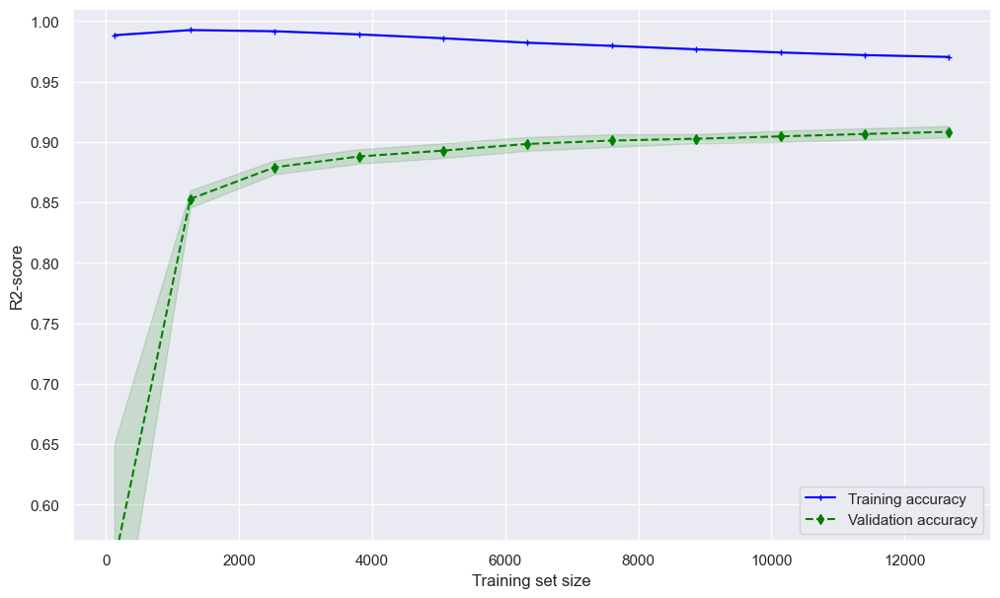

In [227]:
# Learning Curve:

train_sizes, train_scores, test_scores = learning_curve(risk_predictor,
                                                       X=X_train,
                                                       y=y_train_risk,
                                                       train_sizes= [0.01, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0],
                                                       cv = 5,
                                                       n_jobs = -1,
                                                       scoring = 'r2',
                                                       shuffle = False)

# Plotting of the learning curve:

train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

fig=plt.figure(figsize=(12,7))
ax = fig.add_subplot()

ax.plot(train_sizes, train_mean,
         color='blue', marker='+',
         markersize=5, label='Training accuracy')

ax.fill_between(train_sizes,
                 train_mean + train_std,
                 train_mean - train_std,
                 alpha=0.15, color='blue')

ax.plot(train_sizes, test_mean,
         color='green', linestyle='--',
         marker='d', markersize=5,
         label='Validation accuracy')

ax.fill_between(train_sizes,
                 test_mean + test_std,
                 test_mean - test_std,
                 alpha=0.15, color='green')

ax.set_xlabel('Training set size')
ax.set_ylabel('R2-score')
ax.legend(loc='lower right')
ax.set_ylim([0.57, 1.01])
ax.grid(True)
plt.show()

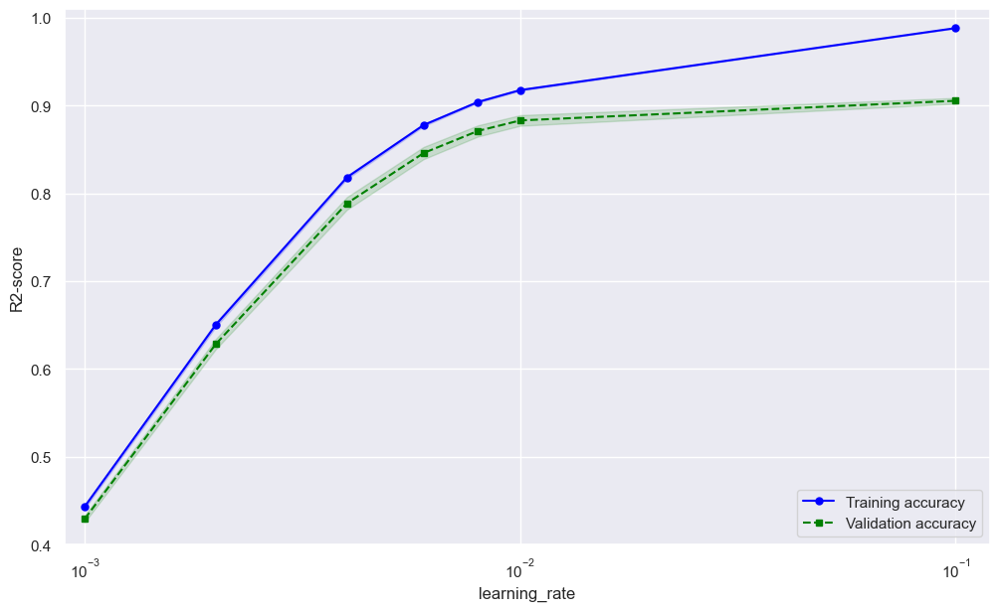

In [228]:
# Validation curve

learning_rate = [0.001, 0.002, 0.004, 0.006, 0.008, 0.01, 0.1]
train_scores, test_scores = validation_curve(risk_predictor,
        X_train, 
        y_train_risk, 
        param_range=learning_rate, 
        param_name='regressor__learning_rate',
        cv=5, 
        n_jobs=-1, 
        scoring='r2'
)

# Plotting of the validation curve:

train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

fig=plt.figure(figsize=(12,7))
ax = fig.add_subplot()
ax.plot(learning_rate, train_mean,
         color='blue', marker='o',
         markersize=5, label='Training accuracy')

ax.fill_between(learning_rate,
                 train_mean + train_std,
                 train_mean - train_std,
                 alpha=0.15, color='blue')

ax.plot(learning_rate, test_mean,
         color='green', linestyle='--',
         marker='s', markersize=5,
         label='Validation accuracy')

ax.fill_between(learning_rate,
                 test_mean + test_std,
                 test_mean - test_std,
                 alpha=0.15, color='green')

ax.set_xlabel('learning_rate')
ax.set_ylabel('R2-score')
ax.legend(loc='lower right')
ax.set_ylim([0.4, 1.01])
ax.set_xscale('log')
ax.set_xlim([0.0009, 0.12])
ax.grid(True)
plt.show()

**STAGE 1.3** DEALING WITH OVERFITTING

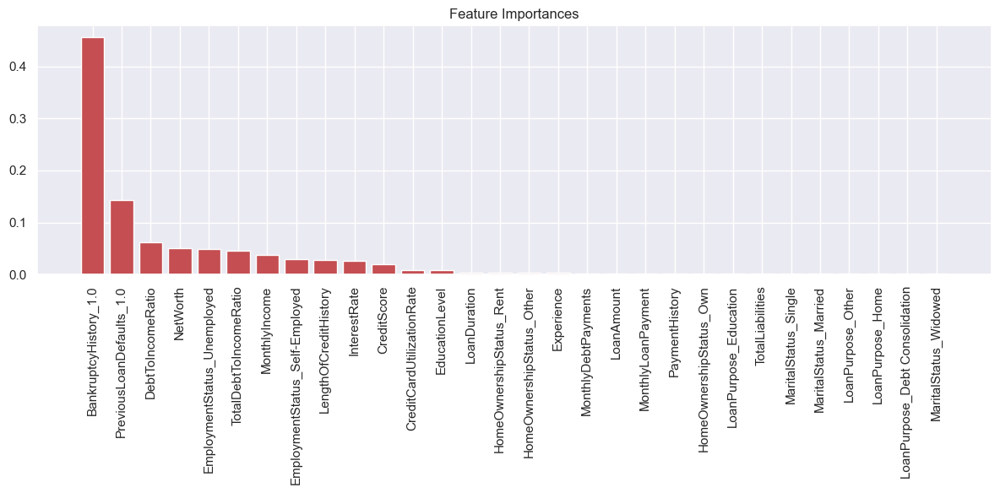

,feature,importance
0,BankruptcyHistory_1.0,0.455672
1,PreviousLoanDefaults_1.0,0.143243
2,DebtToIncomeRatio,0.061750
3,NetWorth,0.050004
4,EmploymentStatus_Unemployed,0.048504
5,TotalDebtToIncomeRatio,0.045896
6,MonthlyIncome,0.038428
7,EmploymentStatus_Self-Employed,0.030032
8,LengthOfCreditHistory,0.028333
9,InterestRate,0.025743


In [229]:
# Computation of feature importances for xgbregressor:

xgb_model = risk_predictor.named_steps['regressor']
feature_names = risk_predictor.named_steps['transformer'].get_feature_names_out()  # Getting the names of the columns out of the column transfomer.

importances = xgb_model.feature_importances_   # Accessing importances from xgb.
feature_importances = pd.DataFrame({'feature': feature_names, 'importance': importances})  # Creation of dataset using feature names and importances.
feature_importances = feature_importances.sort_values('importance', ascending=False).reset_index(drop=True)  # Sorting in descendent order and reordering the indexes (drop the old ones).

plt.figure(figsize=(12, 6))  # Figure creation and plotting.
plt.bar(feature_importances['feature'], feature_importances['importance'], color='r')
plt.xticks(rotation=90)
plt.title('Feature Importances')
plt.tight_layout()
plt.show()

feature_importances

In [230]:
# Function to get the features with importance lower than 0.002 as a list.

def xgb_features(importances):

    xgb_red = []

    for feature, value in zip(feature_importances['feature'], feature_importances['importance']):
        if value < 0.005:
            xgb_red.append(feature)
    
    return xgb_red

xgb_features(feature_importances)

['LoanDuration',
 'HomeOwnershipStatus_Rent',
 'HomeOwnershipStatus_Other',
 'Experience',
 'MonthlyDebtPayments',
 'LoanAmount',
 'MonthlyLoanPayment',
 'PaymentHistory',
 'HomeOwnershipStatus_Own',
 'LoanPurpose_Education',
 'TotalLiabilities',
 'MaritalStatus_Single',
 'MaritalStatus_Married',
 'LoanPurpose_Other',
 'LoanPurpose_Home',
 'LoanPurpose_Debt Consolidation',
 'MaritalStatus_Widowed']

OPTION 1

In [231]:
# Fitting of the model without less important features

X_train_new = X_train.copy()
X_test_new = X_test.copy()

feature_names = risk_predictor.named_steps['transformer'].get_feature_names_out()
X_train_new = pd.DataFrame(risk_predictor.named_steps['transformer'].transform(X_train_new), columns=feature_names).drop(xgb_features(feature_importances), axis=1)
X_test_new = pd.DataFrame(risk_predictor.named_steps['transformer'].transform(X_test_new), columns=feature_names).drop(xgb_features(feature_importances), axis=1)

xgb_model_new = xgb_model
xgb_model_new.fit(X_train_new, y_train_risk)


XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=np.float64(0.00023668458859349962), grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=np.float64(0.04681199890446509), max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=6, max_leaves=None,
             min_child_weight=7, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=500, n_jobs=-1,
             num_parallel_tree=None, random_state=None, ...)

In [232]:
# Scores:

print(f' R2 Score for training set: {r2_score(y_train_risk, xgb_model_new.predict(X_train_new))}')
print(f' R2 Score for test set: {r2_score(y_test_risk, xgb_model_new.predict(X_test_new))}\n')

print(f' MSE Score for training set: {mean_squared_error(y_train_risk, xgb_model_new.predict(X_train_new))}')
print(f' MSE Score for test set: {mean_squared_error(y_test_risk, xgb_model_new.predict(X_test_new))}')

 R2 Score for training set: 0.9595882384298727

 R2 Score for test set: 0.9049517051697705



 MSE Score for training set: 0.0007991034026848269

 MSE Score for test set: 0.001901131448515727


OPTION 2

In [233]:
# Ensemble Learning Techniques to try reduce overfitting:

# Bagging regressor using the original model:

X_train_trans = risk_predictor.named_steps['transformer'].transform(X_train)
X_test_trans = risk_predictor.named_steps['transformer'].transform(X_test)

bagging_regressor = BaggingRegressor(
    estimator=xgb_model,
    n_estimators=200,
    max_samples=0.8,
    n_jobs=-1,
    bootstrap=True
)

bag = bagging_regressor.fit(X_train_trans, y_train_risk)

bag_train = bag.predict(X_train_trans)
bag_test = bag.predict(X_test_trans)

print(f'R2 for Bagging: {r2_score(y_train_risk, bag_train), r2_score(y_test_risk, bag_test)}')


# voting regressor using original model and regression with regularization:

voting = VotingRegressor(
    estimators = [
        ('xgb', xgb_model),
        ('lasso', Lasso(alpha=0.0001))
        ],
    weights = [2, 1]
)

vot = voting.fit(X_train_trans, y_train_risk)

vot_train = vot.predict(X_train_trans)
vot_test = vot.predict(X_test_trans)

print(f'R2 for Voting: {r2_score(y_train_risk, vot_train), r2_score(y_test_risk, vot_test)}')

R2 for Bagging: (0.9562392109116707, 0.9093718828435404)

R2 for Voting: (0.9364834506401869, 0.898263238847089)


OPTION 3

In [240]:
# Refinement of fine tuning of the original model:

over_grid = {
    'regressor__learning_rate': loguniform(0.044, 0.05),
    'regressor__min_child_weight': randint(7, 11),
    'regressor__gamma': loguniform(0.0001, 0.001),
    'regressor__max_depth': [3, 4],
    'regressor__reg_alpha': loguniform(0.001, 0.1),
    'regressor__reg_lambda': loguniform(0.1, 2),
    'regressor__colsample_bytree': [0.8, 0.9]
}

over = RandomizedSearchCV(
    estimator=best_risk_pipeline,
    param_distributions=over_grid,
    cv=5,
    n_iter = 100,
    scoring='neg_mean_squared_error',
    n_jobs=-1,
    random_state=0
)

# Fitting of the rs object:

over.fit(X_train, y_train_risk) 

# scores:

over_predictor = over.best_estimator_  # Best model out of the hyperparameter optimization process.

print(f' R2 Score for training set: {r2_score(y_train_risk, over_predictor.predict(X_train))}')
print(f' R2 Score for test set: {r2_score(y_test_risk, over_predictor.predict(X_test))}\n')

print(f' MSE Score for training set: {mean_squared_error(y_train_risk, over_predictor.predict(X_train))}')
print(f' MSE Score for test set: {mean_squared_error(y_test_risk, over_predictor.predict(X_test))}')

 R2 Score for training set: 0.9347519695464719

 R2 Score for test set: 0.9056616938051566



 MSE Score for training set: 0.00129021653914834

 MSE Score for test set: 0.0018869304391737692


In [241]:
final_regressor = over_predictor

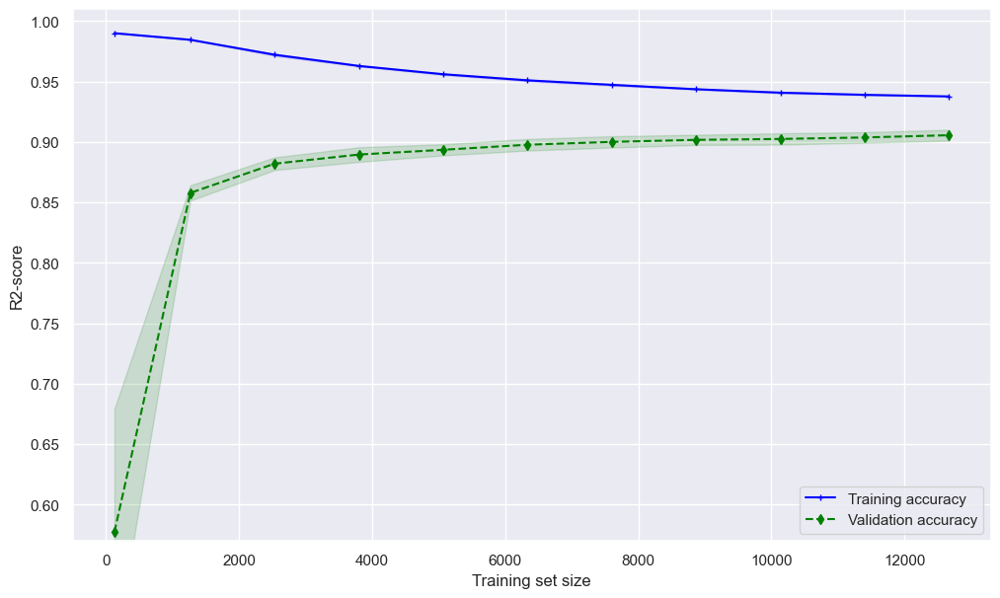

In [242]:
# Learning Curve:

train_sizes, train_scores, test_scores = learning_curve(final_regressor,
                                                       X=X_train,
                                                       y=y_train_risk,
                                                       train_sizes= [0.01, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0],
                                                       cv = 5,
                                                       n_jobs = -1,
                                                       scoring = 'r2',
                                                       shuffle = False)

# Plotting of the learning curve:

train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

fig=plt.figure(figsize=(12,7))
ax = fig.add_subplot()

ax.plot(train_sizes, train_mean,
         color='blue', marker='+',
         markersize=5, label='Training accuracy')

ax.fill_between(train_sizes,
                 train_mean + train_std,
                 train_mean - train_std,
                 alpha=0.15, color='blue')

ax.plot(train_sizes, test_mean,
         color='green', linestyle='--',
         marker='d', markersize=5,
         label='Validation accuracy')

ax.fill_between(train_sizes,
                 test_mean + test_std,
                 test_mean - test_std,
                 alpha=0.15, color='green')

ax.set_xlabel('Training set size')
ax.set_ylabel('R2-score')
ax.legend(loc='lower right')
ax.set_ylim([0.57, 1.01])
ax.grid(True)
plt.show()

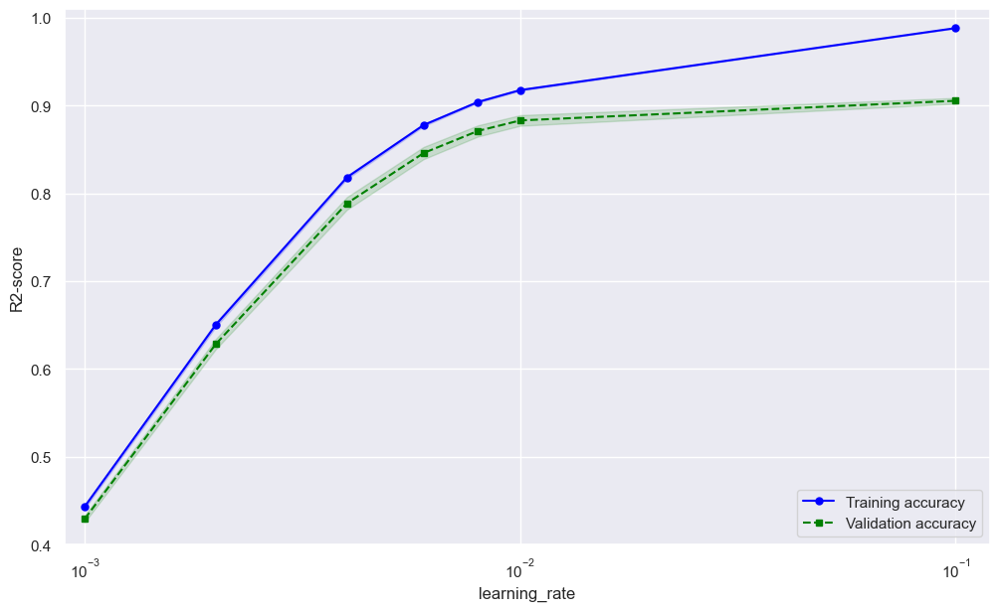

In [243]:
# Validation curve

learning_rate = [0.001, 0.002, 0.004, 0.006, 0.008, 0.01, 0.1]
train_scores, test_scores = validation_curve(risk_predictor,
        X_train, 
        y_train_risk, 
        param_range=learning_rate, 
        param_name='regressor__learning_rate',
        cv=5, 
        n_jobs=-1, 
        scoring='r2'
)

# Plotting of the validation curve:

train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

fig=plt.figure(figsize=(12,7))
ax = fig.add_subplot()
ax.plot(learning_rate, train_mean,
         color='blue', marker='o',
         markersize=5, label='Training accuracy')

ax.fill_between(learning_rate,
                 train_mean + train_std,
                 train_mean - train_std,
                 alpha=0.15, color='blue')

ax.plot(learning_rate, test_mean,
         color='green', linestyle='--',
         marker='s', markersize=5,
         label='Validation accuracy')

ax.fill_between(learning_rate,
                 test_mean + test_std,
                 test_mean - test_std,
                 alpha=0.15, color='green')

ax.set_xlabel('learning_rate')
ax.set_ylabel('R2-score')
ax.legend(loc='lower right')
ax.set_ylim([0.4, 1.01])
ax.set_xscale('log')
ax.set_xlim([0.0009, 0.12])
ax.grid(True)
plt.show()

**LOAN APPROVAL CLASSIFICATION**

**STAGE 2.0**: DATA DEFINITION

In [245]:
X  # Initial dataset without labels.

,CreditScore,EmploymentStatus,EducationLevel,Experience,LoanAmount,LoanDuration,MaritalStatus,HomeOwnershipStatus,MonthlyDebtPayments,CreditCardUtilizationRate,...,LoanPurpose,PreviousLoanDefaults,PaymentHistory,LengthOfCreditHistory,TotalLiabilities,MonthlyIncome,NetWorth,InterestRate,MonthlyLoanPayment,TotalDebtToIncomeRatio
0,617.0,Employed,Master,22.0,13152.0,48.0,Married,Own,183.0,0.354418,...,Home,0.0,29.0,9.0,19183.0,3329.000000,126928.0,0.227590,419.805992,0.181077
1,628.0,Employed,Associate,15.0,NaN,48.0,Single,Mortgage,496.0,0.087827,...,Debt Consolidation,0.0,21.0,9.0,9595.0,3309.083333,43609.0,0.201077,794.054238,0.389852
2,570.0,Employed,Bachelor,26.0,17627.0,36.0,Married,Rent,902.0,0.137414,...,Education,0.0,20.0,22.0,128874.0,3393.666667,5205.0,0.212548,666.406688,0.462157
3,545.0,Employed,High School,34.0,37898.0,96.0,Single,Mortgage,755.0,0.267587,...,Home,0.0,27.0,10.0,5370.0,5757.000000,99452.0,0.300911,1047.506980,0.313098
5,626.0,Self-Employed,Master,16.0,15433.0,72.0,Married,Rent,732.0,0.102211,...,Debt Consolidation,1.0,16.0,19.0,40843.0,14859.166667,27071.0,0.217601,385.577074,0.075211
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19995,587.0,Employed,High School,19.0,24521.0,36.0,Married,Rent,673.0,0.101288,...,Auto,0.0,21.0,7.0,25642.0,2515.000000,55327.0,0.195574,905.767712,0.627741
19996,567.0,Employed,Associate,33.0,25818.0,36.0,Married,Rent,414.0,0.471818,...,Debt Consolidation,0.0,30.0,28.0,5569.0,4103.833333,64002.0,0.199168,958.395633,0.334418
19997,645.0,NaN,Bachelor,20.0,37033.0,72.0,Married,Mortgage,512.0,0.216596,...,Home,0.0,28.0,8.0,4653.0,4079.833333,103663.0,0.226766,945.427454,0.357227
19998,560.0,Employed,High School,36.0,14760.0,72.0,Married,Own,986.0,0.364758,...,Debt Consolidation,0.0,17.0,13.0,11485.0,3418.750000,10600.0,0.264873,411.168284,0.408678


In [246]:
# Initial label dataset:

y

,RiskScore,LoanApproved
0,49.0,0.0
1,52.0,0.0
2,52.0,0.0
3,54.0,0.0
5,44.0,1.0
...,...,...
19995,55.0,0.0
19996,54.0,0.0
19997,45.0,0.0
19998,59.0,0.0


In [247]:
X.shape, y.shape

((19800, 22), (19800, 2))

In [249]:
# Computation of risk score on the entire dataset:

risk_pred = final_regressor.predict(X)

print(f'R2 score on entire dataset: {r2_score(label_transformer.transform(y)[:, 0], risk_pred):.4f}') 
print(f'MSE score on entire dataset: {float(mean_squared_error(label_transformer.transform(y)[:, 0], risk_pred)):.6f}\n')

# Previous performance on just test set:

print(f'R2 score on test set: {r2_score(y_test_risk, final_regressor.predict(X_test)):.4f}') 
print(f'MSE score on test set: {float(mean_squared_error(y_test_risk, final_regressor.predict(X_test))):.6f}')

R2 score on entire dataset: 0.9289

MSE score on entire dataset: 0.001410



R2 score on test set: 0.9057

MSE score on test set: 0.001887


In [252]:
# Concatenation of the predicted risk score on the dataset and label assignment:

X_ultimate = X.copy()
X_ultimate['RiskPredicted'] = risk_pred

y_ultimate = y.iloc[:, 1]  # Label is second column of y dataset.

In [253]:
X_ultimate

,CreditScore,EmploymentStatus,EducationLevel,Experience,LoanAmount,LoanDuration,MaritalStatus,HomeOwnershipStatus,MonthlyDebtPayments,CreditCardUtilizationRate,...,PreviousLoanDefaults,PaymentHistory,LengthOfCreditHistory,TotalLiabilities,MonthlyIncome,NetWorth,InterestRate,MonthlyLoanPayment,TotalDebtToIncomeRatio,RiskPredicted
0,617.0,Employed,Master,22.0,13152.0,48.0,Married,Own,183.0,0.354418,...,0.0,29.0,9.0,19183.0,3329.000000,126928.0,0.227590,419.805992,0.181077,0.284161
1,628.0,Employed,Associate,15.0,NaN,48.0,Single,Mortgage,496.0,0.087827,...,0.0,21.0,9.0,9595.0,3309.083333,43609.0,0.201077,794.054238,0.389852,0.422288
2,570.0,Employed,Bachelor,26.0,17627.0,36.0,Married,Rent,902.0,0.137414,...,0.0,20.0,22.0,128874.0,3393.666667,5205.0,0.212548,666.406688,0.462157,0.410796
3,545.0,Employed,High School,34.0,37898.0,96.0,Single,Mortgage,755.0,0.267587,...,0.0,27.0,10.0,5370.0,5757.000000,99452.0,0.300911,1047.506980,0.313098,0.454443
5,626.0,Self-Employed,Master,16.0,15433.0,72.0,Married,Rent,732.0,0.102211,...,1.0,16.0,19.0,40843.0,14859.166667,27071.0,0.217601,385.577074,0.075211,0.285773
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19995,587.0,Employed,High School,19.0,24521.0,36.0,Married,Rent,673.0,0.101288,...,0.0,21.0,7.0,25642.0,2515.000000,55327.0,0.195574,905.767712,0.627741,0.486854
19996,567.0,Employed,Associate,33.0,25818.0,36.0,Married,Rent,414.0,0.471818,...,0.0,30.0,28.0,5569.0,4103.833333,64002.0,0.199168,958.395633,0.334418,0.404569
19997,645.0,NaN,Bachelor,20.0,37033.0,72.0,Married,Mortgage,512.0,0.216596,...,0.0,28.0,8.0,4653.0,4079.833333,103663.0,0.226766,945.427454,0.357227,0.280203
19998,560.0,Employed,High School,36.0,14760.0,72.0,Married,Own,986.0,0.364758,...,0.0,17.0,13.0,11485.0,3418.750000,10600.0,0.264873,411.168284,0.408678,0.559491


In [254]:
X_ultimate.shape

(19800, 23)

In [255]:
y_ultimate

0        0.0
1        0.0
2        0.0
3        0.0
5        1.0
        ... 
19995    0.0
19996    0.0
19997    0.0
19998    0.0
19999    0.0
Name: LoanApproved, Length: 19800, dtype: float64

**STAGE 2.1**: SANITY CHECK

In [256]:
# Pipeline for loan classification

model_loan = IMBPipeline([
    ('transformer', data_transformer),
    ('sampler', None),
    ('poly', None),
    ('reduction', LDA()),
    ('classifier', Perceptron())
])

In [257]:
# Data splitting:

X_train, X_test, y_train, y_test = train_test_split(X_ultimate, y_ultimate, test_size=0.2, random_state=42, stratify=y_ultimate)

In [258]:
y_train = y_train.astype(int)  # Converting label from float to integer to avoid numerical problems.

In [259]:
y_train.shape, y_test.shape

((15840,), (3960,))

In [260]:
# Ratio of label:

float(((y_train == 1).sum() / (y_train == 0).sum()).round(2))

0.31

In [261]:
# Pipeline fitting:

model_loan.fit(X_train, y_train)

Pipeline(steps=[('transformer',
                 ColumnTransformer(force_int_remainder_cols=False,
                                   remainder='passthrough',
                                   sparse_threshold=0.2,
                                   transformers=[('num_stand_median',
                                                  Pipeline(steps=[('imputer1',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('scaler1',
                                                                   StandardScaler())]),
                                                  ['MonthlyLoanPayment',
                                                   'InterestRate',
                                                   'MonthlyDebtPayments',
                                                   'Experience',
                                                   'MonthlyIncome', 'NetWorth'...
                                                  Pipeline(steps=[('imputer5',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('encoder2',
                                                                   OneHotEncoder(drop='first'))]),
                                                  ['EmploymentStatus',
                                                   'MaritalStatus',
                                                   'HomeOwnershipStatus',
                                                   'LoanPurpose',
                                                   'BankruptcyHistory',
                                                   'PreviousLoanDefaults'])],
                                   verbose_feature_names_out=False)),
                ('sampler', None), ('poly', None),
                ('reduction', LinearDiscriminantAnalysis()),
                ('classifier', Perceptron())])

In [262]:
# Predictions on test set:

loan_results_train = model_loan.predict(X_train)
loan_results_test = model_loan.predict(X_test)

print(f'Accuracy score on training set: {accuracy_score(y_train, loan_results_train)}')   # Accurcy score on both training and test set.
print(f'Accuracy score on test set: {accuracy_score(y_test, loan_results_test)}')  

Accuracy score on training set: 0.9548611111111112

Accuracy score on test set: 0.9313131313131313


**STAGE 2.2**: HYPERPARAMETER OPTIMIZATION:

In [264]:
# Possible combinations of parameters:


no_sampling = {
    'sampler': [None]
    }

ros = {
    'sampler': [RandomOverSampler()],
    'sampler__sampling_strategy': [0.5, 0.75, 1.0, 'minority']
    }

rus = {
    'sampler': [RandomUnderSampler()],
    'sampler__sampling_strategy': [0.5, 0.75, 1.0, 'majority']
    }



no_reduction = {
    'reduction': [None]
    }

pca = {
    'reduction': [PCA()],
    'reduction__n_components': [0.8, 0.85, 0.9, 0.95]
    }

lda = {
    'reduction': [LDA()]
    }


kn = {
    'classifier': [KNeighborsClassifier()],
    'classifier__n_neighbors': [3, 5, 7, 9]
    }

per = {
    'classifier': [Perceptron(n_jobs=-1)],
    'classifier__penalty': ['l1', 'l2'],
    'classifier__eta0': loguniform(0.001, 1),
    'classifier__alpha': loguniform(0.0001, 0.1)
    }

lr = {
    'classifier': [LogisticRegression(max_iter=1000, solver='lbfgs', penalty='l2', n_jobs=-1)],
    'poly': [None, PolynomialFeatures(degree=2, include_bias=False)],        
    'classifier__C': loguniform(0.0001, 10),
    'classifier__class_weight' : [None, 'balanced']
    }

dt = {
    'classifier': [DecisionTreeClassifier()],
    'classifier__max_depth': [3, 5, 10, 15, 20, None],
    'classifier__min_samples_leaf': [1, 2, 4, 8, 16],
    'classifier__criterion': ['gini', 'entropy']
    }

rf = {
    'classifier': [RandomForestClassifier(n_jobs=-1)],
    'classifier__max_depth': [3, 5, 10, 15, 20, None],
    'classifier__min_samples_leaf': [1, 2, 4, 8, 16],
    'classifier__n_estimators': [50, 100, 200, 300]
    }

xgb = {
    'classifier': [XGBClassifier(n_jobs=-1)],
    'classifier__learning_rate': loguniform(0.01, 0.2),
    'classifier__n_estimators': [100, 200, 300, 500],
    'classifier__subsample': [0.8, 0.9, 1],
}

sampler_config = [ros, rus, no_sampling]
estimator_config = [per, kn, lr, dt, rf, xgb]
reduction_config = [pca, lda, no_reduction]

In [265]:
# Computation of all configurations:

all_configs = [dict(itertools.chain(*(e.items() for e in configuration))) for configuration in itertools.product(sampler_config, reduction_config, estimator_config)]

In [266]:
# Number of total configurations:

print(f' Number of total configurations: {len(all_configs)}')

 Number of total configurations: 54


In [268]:
# Nested Cross Validation

scoring = {
    'accuracy': 'accuracy',
    'f1': 'f1'
}

# Inner Loop:

rs = RandomizedSearchCV(
    estimator=model_loan,
    param_distributions=all_configs,
    n_iter=100,
    cv=2,
    verbose=1,
    n_jobs=-1,
    error_score='raise',
)

# Outer Loop:

loan_scores = cross_validate(
    rs, 
    X_train, 
    y_train, 
    cv=5, 
    scoring=scoring,
    verbose=3,
    return_estimator=True, 
)

Fitting 2 folds for each of 100 candidates, totalling 200 fits

[CV] END ............ accuracy: (test=0.958) f1: (test=0.914) total time=  25.1s

Fitting 2 folds for each of 100 candidates, totalling 200 fits

[CV] END ............ accuracy: (test=0.953) f1: (test=0.902) total time=  21.0s

Fitting 2 folds for each of 100 candidates, totalling 200 fits

[CV] END ............ accuracy: (test=0.962) f1: (test=0.921) total time=  30.6s

Fitting 2 folds for each of 100 candidates, totalling 200 fits

[CV] END ............ accuracy: (test=0.968) f1: (test=0.932) total time=  39.8s

Fitting 2 folds for each of 100 candidates, totalling 200 fits

[CV] END ............ accuracy: (test=0.968) f1: (test=0.934) total time=  38.9s


In [269]:
# Mean and std of the scores across the folds:

accuracy_scores = loan_scores['test_accuracy']
f1_scores = loan_scores['test_f1']

mean_accuracy = np.mean(accuracy_scores)
std_accuracy = np.std(accuracy_scores)

mean_f1 = np.mean(f1_scores)
std_f1 = np.std(f1_scores)

print(f"Mean accuracy: {mean_accuracy:.4f} ± {std_accuracy:.4f}")
print(f"Mean F1: {mean_f1:.4f} ± {std_f1:.4f}")

Mean accuracy: 0.9618 ± 0.0060

Mean F1: 0.9205 ± 0.0121


In [270]:
# Best estimtor, with corresponding parameter and score for each fold:

for index, estimator in enumerate(loan_scores['estimator']):
    print(estimator.best_estimator_.get_params()['sampler'])
    print(estimator.best_estimator_.get_params()['poly'])
    print(estimator.best_estimator_.get_params()['reduction'])
    print(estimator.best_estimator_.get_params()['classifier'], estimator.best_estimator_.get_params()['classifier'].get_params())
    print(loan_scores['test_accuracy'][index])
    print(loan_scores['test_f1'][index])
    print('-'*20)

None

PolynomialFeatures(include_bias=False)

LinearDiscriminantAnalysis()

LogisticRegression(C=np.float64(0.0023040809214717297), class_weight='balanced',

                   max_iter=1000, n_jobs=-1) {'C': np.float64(0.0023040809214717297), 'class_weight': 'balanced', 'dual': False, 'fit_intercept': True, 'intercept_scaling': 1, 'l1_ratio': None, 'max_iter': 1000, 'multi_class': 'deprecated', 'n_jobs': -1, 'penalty': 'l2', 'random_state': None, 'solver': 'lbfgs', 'tol': 0.0001, 'verbose': 0, 'warm_start': False}

0.9577020202020202

0.9137709137709138

--------------------

RandomUnderSampler(sampling_strategy=0.5)

None

LinearDiscriminantAnalysis()

XGBClassifier(base_score=None, booster=None, callbacks=None,

              colsample_bylevel=None, colsample_bynode=None,

              colsample_bytree=None, device=None, early_stopping_rounds=None,

              enable_categorical=False, eval_metric=None, feature_types=None,

              gamma=None, grow_policy=None, importance_

In [271]:
# Score on full training and test set for each estimator out of the nested cross validation:

for estimator in loan_scores['estimator']:
    pred_train = estimator.best_estimator_.fit(X_train, y_train)
    pred_train = estimator.best_estimator_.predict(X_train)
    pred_test = estimator.best_estimator_.predict(X_test)
    accuracy_train = accuracy_score(y_train, pred_train)
    accuracy_test = accuracy_score(y_test, pred_test)
    f1_train = f1_score(y_train, pred_train)
    f1_test = f1_score(y_test, pred_test)
    
    print(f'Accuracy on training set:{accuracy_train:.4f}, Accuracy on test set:{accuracy_test:.4f}')
    print(f'F1 on training set:{f1_train:.5f}, F1 on test set:{f1_test:.5f}')
    print('-'*20)

Accuracy on training set:0.9648, Accuracy on test set:0.9374

F1 on training set:0.92854, F1 on test set:0.87475

--------------------

Accuracy on training set:0.9553, Accuracy on test set:0.9303

F1 on training set:0.90815, F1 on test set:0.85861

--------------------

Accuracy on training set:0.9681, Accuracy on test set:0.9422

F1 on training set:0.93253, F1 on test set:0.87864

--------------------

Accuracy on training set:1.0000, Accuracy on test set:0.9495

F1 on training set:1.00000, F1 on test set:0.89418

--------------------

Accuracy on training set:0.9994, Accuracy on test set:0.9505

F1 on training set:0.99881, F1 on test set:0.89792

--------------------


**STAGE 2.3**: FINE TUNING

In [277]:
# Final Pipeline for loan approval:

best_loan_pipeline = Pipeline([
    ('transformer', data_transformer),
    ('poly', PolynomialFeatures(degree=2, include_bias=False)),
    ('reduction', LDA()),
    ('classifier', LogisticRegression(solver='lbfgs', max_iter=2000, penalty='l2', n_jobs=-1))
])

In [278]:
# Logistic Regression grid

lr = {
    'classifier__C': loguniform(0.1, 1)
    }

In [279]:
# Randomized search grid to find the best value of C for Logistic regression:

rs_best_loan = RandomizedSearchCV(
    estimator=best_loan_pipeline,
    param_distributions=lr,
    cv=5,
    n_iter = 50,
    scoring='f1',  # Since scoring f1 is generally lower than accuracy, we aim to improve f1 rather than accuracy.
    n_jobs=-1,
    random_state=0
)

rs_best_loan.fit(X_train, y_train)

RandomizedSearchCV(cv=5,
                   estimator=Pipeline(steps=[('transformer',
                                              ColumnTransformer(force_int_remainder_cols=False,
                                                                remainder='passthrough',
                                                                sparse_threshold=0.2,
                                                                transformers=[('num_stand_median',
                                                                               Pipeline(steps=[('imputer1',
                                                                                                SimpleImputer(strategy='median')),
                                                                                               ('scaler1',
                                                                                                StandardScaler())]),
                                                                               ['MonthlyLoanPayment',
                                                                                'InterestRate',
                                                                                'MonthlyDebtPayments',
                                                                                'Expe...
                                                                                'PreviousLoanDefaults'])],
                                                                verbose_feature_names_out=False)),
                                             ('poly',
                                              PolynomialFeatures(include_bias=False)),
                                             ('reduction',
                                              LinearDiscriminantAnalysis()),
                                             ('classifier',
                                              LogisticRegression(max_iter=2000,
                                                                 n_jobs=-1))]),
                   n_iter=50, n_jobs=-1,
                   param_distributions={'classifier__C': <scipy.stats._distn_infrastructure.rv_continuous_frozen object at 0x17e8442c0>},
                   random_state=0, scoring='f1')

In [319]:
# Scores for both trianing and test set:

loan_classifier = rs_best_loan.best_estimator_

print(f'Accuracy/F1 for training set: {accuracy_score(y_train, loan_classifier.predict(X_train)), float(f1_score(y_train, loan_classifier.predict(X_train)))}')

print(f'Accuracy/F1 for test set: {accuracy_score(y_test, loan_classifier.predict(X_test)), float(f1_score(y_test, loan_classifier.predict(X_test)))}')

Accuracy/F1 for training set: (0.9681818181818181, 0.9326743254074272)

Accuracy/F1 for test set: (0.9424242424242424, 0.8792372881355932)


**STAGE 2.4**: ANALYSIS OF RESULTS

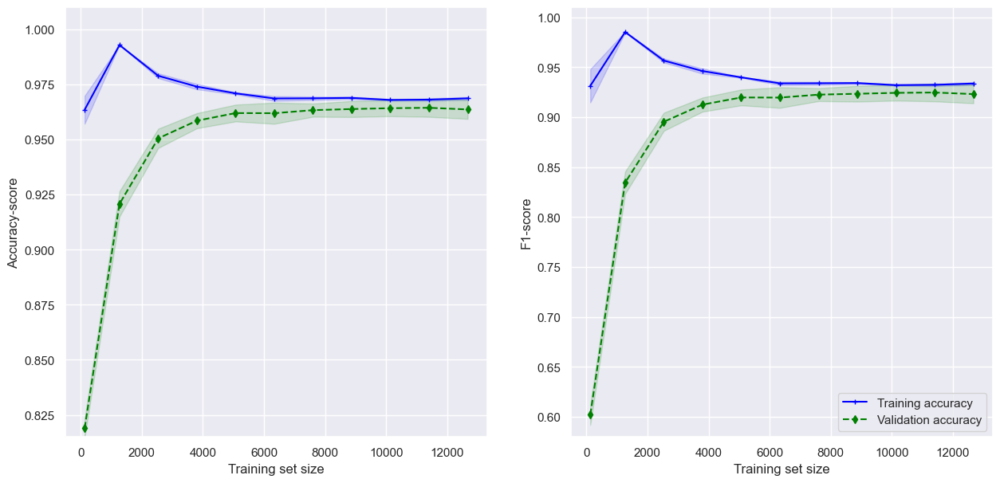

In [289]:
# Learning Curve

train_sizes_acc, train_scores_acc, test_scores_acc = learning_curve(loan_classifier,
                                                       X=X_train,
                                                       y=y_train,
                                                       train_sizes= [0.01, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0],
                                                       cv = 5,
                                                       n_jobs = -1,
                                                       scoring = 'accuracy',
                                                       shuffle = False)

train_sizes_f1, train_scores_f1, test_scores_f1 = learning_curve(loan_classifier,
                                                       X=X_train,
                                                       y=y_train,
                                                       train_sizes= [0.01, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0],
                                                       cv = 5,
                                                       n_jobs = -1,
                                                       scoring = 'f1',
                                                       shuffle = False)


train_mean_acc = np.mean(train_scores_acc, axis=1)
train_std_acc = np.std(train_scores_acc, axis=1)
test_mean_acc = np.mean(test_scores_acc, axis=1)
test_std_acc = np.std(test_scores_acc, axis=1)

fig, ax = plt.subplots(1, 2, figsize=(15, 7))


ax[0].plot(train_sizes, train_mean_acc,
         color='blue', marker='+',
         markersize=5, label='Training accuracy')

ax[0].fill_between(train_sizes_acc,
                 train_mean_acc + train_std_acc,
                 train_mean_acc - train_std_acc,
                 alpha=0.15, color='blue')

ax[0].plot(train_sizes_acc, test_mean_acc,
         color='green', linestyle='--',
         marker='d', markersize=5,
         label='Validation accuracy')

ax[0].fill_between(train_sizes_acc,
                 test_mean_acc + test_std_acc,
                 test_mean_acc - test_std_acc,
                 alpha=0.15, color='green')

ax[0].set_xlabel('Training set size')
ax[0].set_ylabel('Accuracy-score')
ax[0].set_ylim([0.815, 1.01])
ax[0].grid(True)


train_mean_f1 = np.mean(train_scores_f1, axis=1)
train_std_f1 = np.std(train_scores_f1, axis=1)
test_mean_f1 = np.mean(test_scores_f1, axis=1)
test_std_f1 = np.std(test_scores_f1, axis=1)

ax[1].plot(train_sizes_f1, train_mean_f1,
         color='blue', marker='+',
         markersize=5, label='Training accuracy')

ax[1].fill_between(train_sizes_f1,
                 train_mean_f1 + train_std_f1,
                 train_mean_f1 - train_std_f1,
                 alpha=0.15, color='blue')

ax[1].plot(train_sizes_f1, test_mean_f1,
         color='green', linestyle='--',
         marker='d', markersize=5,
         label='Validation accuracy')

ax[1].fill_between(train_sizes_f1,
                 test_mean_f1 + test_std_f1,
                 test_mean_f1 - test_std_f1,
                 alpha=0.15, color='green')

ax[1].set_xlabel('Training set size')
ax[1].set_ylabel('F1-score')
ax[1].legend(loc='lower right')
ax[1].set_ylim([0.58, 1.01])
ax[1].grid(True)

plt.show()

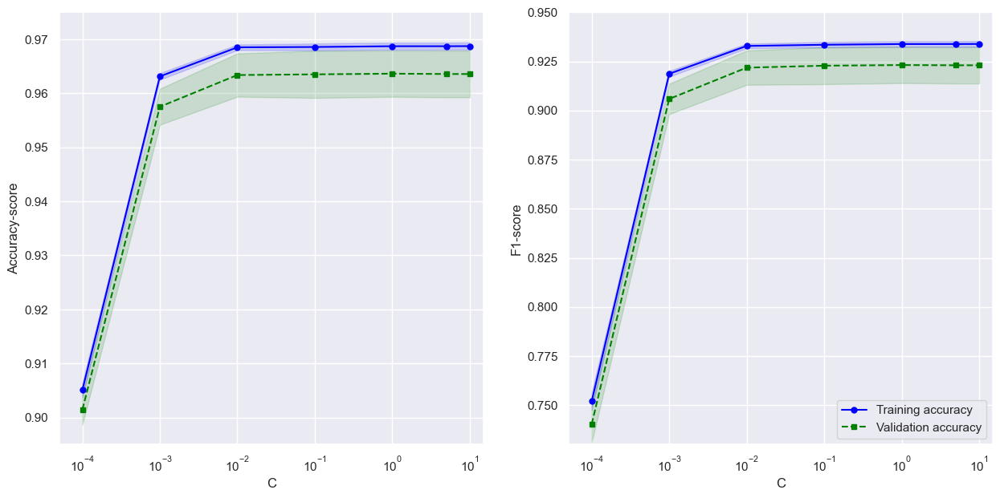

In [287]:
# Validation curve

C = [0.0001, 0.001, 0.01, 0.1, 1, 5, 10]

train_scores_acc, test_scores_acc = validation_curve(loan_classifier,
        X_train, 
        y_train, 
        param_range=C, 
        param_name='classifier__C',
        cv=5, 
        n_jobs=-1, 
        scoring='accuracy'
)

train_scores_f1, test_scores_f1 = validation_curve(loan_classifier,
        X_train, 
        y_train, 
        param_range=C, 
        param_name='classifier__C',
        cv=5, 
        n_jobs=-1, 
        scoring='f1'
)


train_mean_acc = np.mean(train_scores_acc, axis=1)
train_std_acc = np.std(train_scores_acc, axis=1)
test_mean_acc = np.mean(test_scores_acc, axis=1)
test_std_acc = np.std(test_scores_acc, axis=1)

fig, ax = plt.subplots(1, 2, figsize=(15, 7))

ax[0].plot(C, train_mean_acc,
         color='blue', marker='o',
         markersize=5, label='Training accuracy')

ax[0].fill_between(C,
                 train_mean_acc + train_std_acc,
                 train_mean_acc - train_std_acc,
                 alpha=0.15, color='blue')

ax[0].plot(C, test_mean_acc,
         color='green', linestyle='--',
         marker='s', markersize=5,
         label='Validation accuracy')

ax[0].fill_between(C,
                 test_mean_acc + test_std_acc,
                 test_mean_acc - test_std_acc,
                 alpha=0.15, color='green')

ax[0].set_xlabel('C')
ax[0].set_ylabel('Accuracy-score')
ax[0].set_ylim([0.895, 0.975])
ax[0].set_xscale('log')
ax[0].set_xlim([0.00005, 15])
ax[0].grid(True)

train_mean_f1 = np.mean(train_scores_f1, axis=1)
train_std_f1 = np.std(train_scores_f1, axis=1)
test_mean_f1 = np.mean(test_scores_f1, axis=1)
test_std_f1 = np.std(test_scores_f1, axis=1)

ax[1].plot(C, train_mean_f1,
         color='blue', marker='o',
         markersize=5, label='Training accuracy')

ax[1].fill_between(C,
                 train_mean_f1 + train_std_f1,
                 train_mean_f1 - train_std_f1,
                 alpha=0.15, color='blue')

ax[1].plot(C, test_mean_f1,
         color='green', linestyle='--',
         marker='s', markersize=5,
         label='Validation accuracy')

ax[1].fill_between(C,
                 test_mean_f1 + test_std_f1,
                 test_mean_f1 - test_std_f1,
                 alpha=0.15, color='green')

ax[1].set_xlabel('C')
ax[1].set_ylabel('F1-score')
ax[1].set_ylim([0.73, 0.95])
ax[1].set_xscale('log')
ax[1].legend(loc='lower right')
ax[1].set_xlim([0.00005, 15])
ax[1].grid(True)

plt.show()

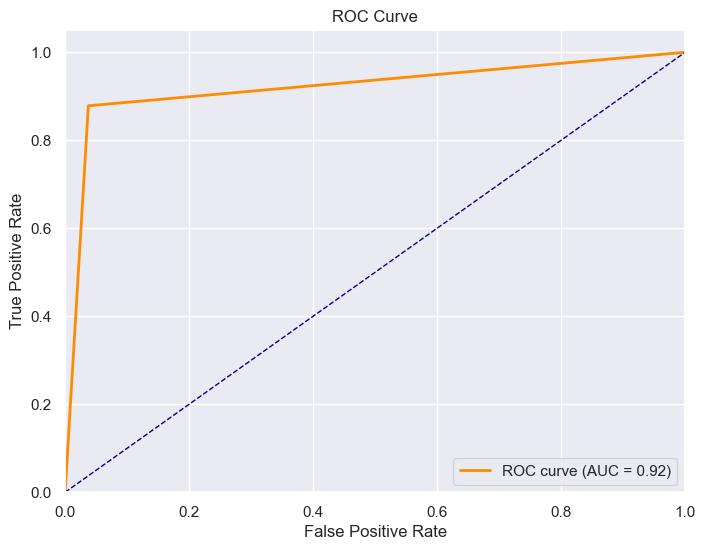

In [341]:
# ROC AUC Curve:

fpr, tpr, thresholds = roc_curve(y_test, loan_classifier.predict(X_test))


roc_auc = auc(fpr, tpr)


plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=1, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc="lower right")
plt.show()

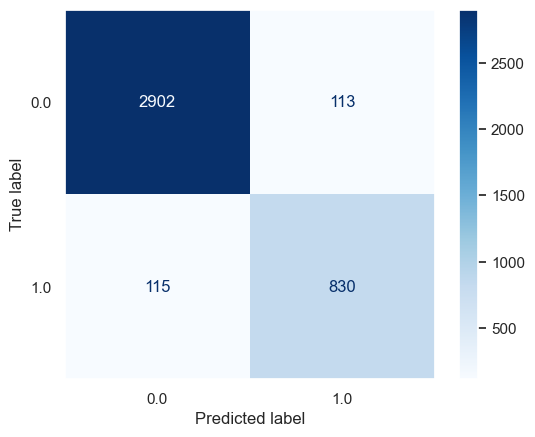

In [327]:
# Confusion matrix plotting:

ConfusionMatrixDisplay.from_predictions(y_test, loan_classifier.predict(X_test), cmap='Blues')
plt.grid(False)
plt.show()

**FINAL PIPELINE**

In [290]:
# Extraction of main steps from the previous stage:

transformation = final_regressor.named_steps['transformer']    # Data transformation (column trasnformer already fitted on train set of risk regression task).

risk_regressor = final_regressor.named_steps['regressor']     # Regressor already fitted on train set of risk regression task.

polynomial = loan_classifier.named_steps['poly']              # Polynomial trasnformation fitted on train set of loan approval stage.

reduction = loan_classifier.named_steps['reduction']          # Reduction application.

loan_classifier = loan_classifier.named_steps['classifier']   # Binary classifier fitted on train set of loan approval stage.

In [294]:
# Creation of costum transformer for encapsulating the steps together:

class RiskScoreTransformer(BaseEstimator, TransformerMixin):

    def __init__(self, risk_regressor, transformation):  # We put as input the risk regressor (xgbregressor) and the data transformation (column transformer).
        self.risk_regressor = risk_regressor
        self.transformation = transformation
    
    def fit(self, X, y=None):    # Everything already fitted.
        return self

    def transform(self, X):                                          # We put as input of transform method our dataset X.
        X_transformed = self.transformation.transform(X)             # We transform X according to the transformation passed before.
        risk_scores = self.risk_regressor.predict(X_transformed)     # We predict the risk score using the regressor.
        X_with_risk = np.column_stack((X_transformed, risk_scores))  # We aggregrate the risk scores to X forming the new dataset which will be returned.
        return X_with_risk


class LoanApprovalClassifier(BaseEstimator, TransformerMixin):
    def __init__(self, polynomial, reduction, loan_classifier):      # We put as input the polynomial, reduction and binary classifier.
        self.polynomial = polynomial
        self.reduction = reduction
        self.loan_classifier = loan_classifier

    def fit(self, X, y=None):       # Everything already fitted.
        return self

    def transform(self, X):
        X_poly = self.polynomial.transform(X)            # Polynomial transformation.
        X_reduced = self.reduction.transform(X_poly)     # Reduction application
        return X_reduced
    
    def predict(self, X):
        X_reduced = self.transform(X)                    # Assigns transformation to X_reduced.
        return self.loan_classifier.predict(X_reduced)   # Loan prediction

In [295]:
# Composite pipeline creation to encapsulate everything:

def create_composite_pipeline(transformation, risk_regressor, polynomial, reduction, loan_classifier):  # Main steps as input.
    
    risk_score_transformer = RiskScoreTransformer(risk_regressor, transformation)                 # Initialization of both custom transformers.
    loan_approval_classifier = LoanApprovalClassifier(polynomial, reduction, loan_classifier)

    composite_pipeline = Pipeline([
        ('risk_score_transformer', risk_score_transformer),            # We put each step in the pipeline, so that the dataset resulting from risk prediciton enters as input for the transform method in the loan prediction.
        ('loan_approval_classifier', loan_approval_classifier)
    ])
    
    return composite_pipeline

final_pipeline = create_composite_pipeline(transformation, risk_regressor, polynomial, reduction, loan_classifier)

In [296]:
final_pipeline

Pipeline(steps=[('risk_score_transformer',
                 RiskScoreTransformer(risk_regressor=XGBRegressor(base_score=None,
                                                                  booster=None,
                                                                  callbacks=None,
                                                                  colsample_bylevel=None,
                                                                  colsample_bynode=None,
                                                                  colsample_bytree=0.9,
                                                                  device=None,
                                                                  early_stopping_rounds=None,
                                                                  enable_categorical=False,
                                                                  eval_metric=None,
                                                                  feature_types=None,
                                                                  gamma=np.float64(0.0009661226832693725),
                                                                  grow_poli...
                                                                                       'HomeOwnershipStatus',
                                                                                       'LoanPurpose',
                                                                                       'BankruptcyHistory',
                                                                                       'PreviousLoanDefaults'])],
                                                                       verbose_feature_names_out=False))),
                ('loan_approval_classifier',
                 LoanApprovalClassifier(loan_classifier=LogisticRegression(C=np.float64(0.3538453590906551),
                                                                           max_iter=2000,
                                                                           n_jobs=-1),
                                        polynomial=PolynomialFeatures(include_bias=False),
                                        reduction=LinearDiscriminantAnalysis()))])

In [300]:
# Application of final pipeline to X:

loan_final = final_pipeline.predict(X)

# Extraction of loan approved label for entire dataset:

loan_real = df_semi_clean.iloc[:, -2]

# Accuracy/f1 score for the final pipeline wrt the real loan approvation.

accuracy_score(loan_real, loan_final), float(f1_score(loan_real, loan_final))

(0.963030303030303, 0.921911670578195)

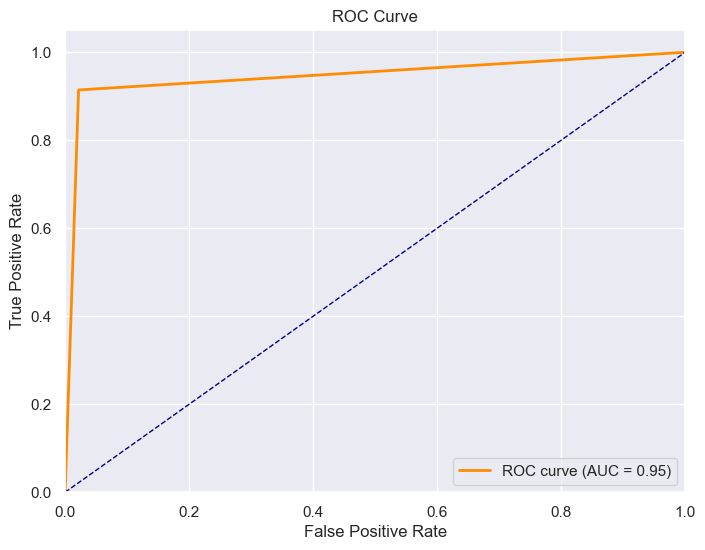

In [339]:
# ROC AUC Curve:

fpr, tpr, thresholds = roc_curve(loan_real, loan_final)

roc_auc = auc(fpr, tpr)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=1, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc="lower right")
plt.show()

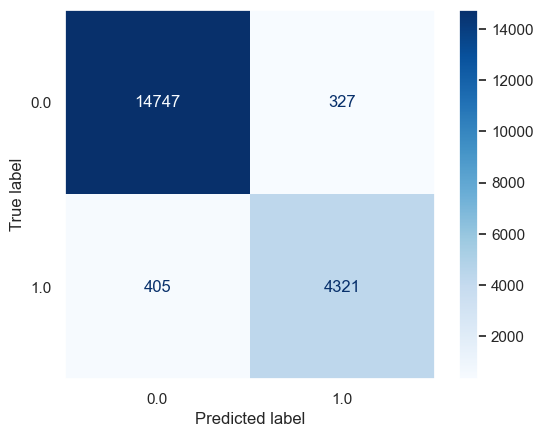

In [326]:
# Confusion matrix plotting:

ConfusionMatrixDisplay.from_predictions(loan_real, loan_final, cmap='Blues')
plt.grid(False)
plt.show()